In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from joblib import dump
import shap
import lime
from lime.lime_tabular import LimeTabularExplainer

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)

In [ ]:
flights = pd.read_csv("US_flights_2023.csv")
flights.head()

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Dep_Delay,Dep_Delay_Tag,Dep_Delay_Type,Arr_Airport,Arr_CityName,Arr_Delay,Arr_Delay_Type,Flight_Duration,Distance_type,Delay_Carrier,Delay_Weather,Delay_NAS,Delay_Security,Delay_LastAircraft,Manufacturer,Model,Aicraft_age
0,2023-01-02,1,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,-3,0,Low <5min,LGA,"New York, NY",-12,Low <5min,56,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,16
1,2023-01-03,2,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,-5,0,Low <5min,LGA,"New York, NY",-8,Low <5min,62,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,16
2,2023-01-04,3,Endeavor Air,N331PQ,BDL,"Hartford, CT",Morning,-5,0,Low <5min,LGA,"New York, NY",-21,Low <5min,49,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,10
3,2023-01-05,4,Endeavor Air,N906XJ,BDL,"Hartford, CT",Morning,-6,0,Low <5min,LGA,"New York, NY",-17,Low <5min,54,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,17
4,2023-01-06,5,Endeavor Air,N337PQ,BDL,"Hartford, CT",Morning,-1,0,Low <5min,LGA,"New York, NY",-16,Low <5min,50,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,10


In [ ]:
flights_df = flights.copy()

# 0. Framing the Problem Statement

Our problem statement is predicting departure delay of 60mins or more, we create target column for departure delay of 60mins or more.

In [ ]:
# created 2 variables for any delay or severe delay

flights_df['is_delay'] = (flights_df['Dep_Delay'] > 0).astype(int)
flights_df['is_severe_delay'] = (flights_df['Dep_Delay'] >= 60).astype(int)
flights_df[flights_df['Dep_Delay'] >= 60]

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Dep_Delay,Dep_Delay_Tag,Dep_Delay_Type,Arr_Airport,Arr_CityName,Arr_Delay,Arr_Delay_Type,Flight_Duration,Distance_type,Delay_Carrier,Delay_Weather,Delay_NAS,Delay_Security,Delay_LastAircraft,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay
12,2023-01-12,4,Endeavor Air,N197PQ,LGA,"New York, NY",Evening,132,1,Hight >60min,BGM,"Binghamton, NY",132,Hight >60min,59,Short Haul >1500Mi,50,0,0,0,82,CANADAIR REGIONAL JET,CRJ,16,1,1
18,2023-01-19,4,Endeavor Air,N691CA,LGA,"New York, NY",Evening,676,1,Hight >60min,BGM,"Binghamton, NY",673,Hight >60min,56,Short Haul >1500Mi,0,667,0,0,6,CANADAIR REGIONAL JET,CRJ,17,1,1
81,2023-01-12,4,Endeavor Air,N905XJ,JFK,"New York, NY",Evening,86,1,Hight >60min,ITH,"Ithaca/Cortland, NY",149,Hight >60min,132,Short Haul >1500Mi,0,0,63,0,86,CANADAIR REGIONAL JET,CRJ,17,1,1
84,2023-01-15,7,Endeavor Air,N301PQ,JFK,"New York, NY",Evening,110,1,Hight >60min,ITH,"Ithaca/Cortland, NY",132,Hight >60min,91,Short Haul >1500Mi,57,0,22,0,53,CANADAIR REGIONAL JET,CRJ,11,1,1
91,2023-01-22,7,Endeavor Air,N538CA,JFK,"New York, NY",Evening,108,1,Hight >60min,ITH,"Ithaca/Cortland, NY",109,Hight >60min,70,Short Haul >1500Mi,0,0,65,0,44,CANADAIR REGIONAL JET,CRJ,16,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6743391,2023-12-31,7,JetBlue Airways,N3065J,MIA,"Miami, FL",Evening,943,1,Hight >60min,JFK,"New York, NY",918,Hight >60min,164,Short Haul >1500Mi,852,0,0,0,66,AIRBUS,A220,3,1,1
6743392,2023-12-31,7,JetBlue Airways,N3065J,JFK,"New York, NY",Afternoon,66,1,Hight >60min,MIA,"Miami, FL",86,Hight >60min,213,Short Haul >1500Mi,66,0,20,0,0,AIRBUS,A220,3,1,1
6743393,2023-12-31,7,JetBlue Airways,N552JB,FLL,"Fort Lauderdale, FL",Afternoon,245,1,Hight >60min,JFK,"New York, NY",239,Hight >60min,176,Short Haul >1500Mi,4,0,0,0,235,AIRBUS,A320,22,1,1
6743394,2023-12-31,7,JetBlue Airways,N937JB,BOS,"Boston, MA",Afternoon,60,1,Medium >15min,BUF,"Buffalo, NY",43,Medium >15min,80,Short Haul >1500Mi,43,0,0,0,0,AIRBUS,A321,10,1,1


In [ ]:
severe_delayed_flights_df = flights_df[flights_df['Dep_Delay'] >= 60]
delayed_flights_df = flights_df[flights_df['Dep_Delay'] > 0]

total_rows = flights_df.shape[0]
severe_delayed_rows = severe_delayed_flights_df.shape[0]
delayed_rows = delayed_flights_df.shape[0]

severe_percentage = (severe_delayed_rows / total_rows) * 100
percentage = (delayed_rows / total_rows) * 100

print(f"Percentage of flights delayed by 60 minutes or more: {severe_percentage:.2f}%")
print(f"Percentage of flights delayed by 0 minutes or more: {percentage:.2f}%")

Percentage of flights delayed by 60 minutes or more: 6.88%
Percentage of flights delayed by 0 minutes or more: 37.90%


2. Since the data is temporal in nature, we need to drop features which are not avaliable during prediction.

In [ ]:
# keeping flight duration since it can be determined before the flight takes off

flights_df.drop(columns=['Dep_Delay',
                         'Dep_Delay_Tag',
                         'Dep_Delay_Type',
                         'Arr_Delay',
                         'Arr_Delay_Type',
                        #  'Flight_Duration',
                         'Delay_Carrier',
                         'Delay_Weather',
                         'Delay_NAS',
                         'Delay_Security',
                         'Delay_LastAircraft'], inplace=True)

flights_df.head()

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Arr_Airport,Arr_CityName,Flight_Duration,Distance_type,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay
0,2023-01-02,1,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",56,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0
1,2023-01-03,2,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",62,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0
2,2023-01-04,3,Endeavor Air,N331PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",49,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0
3,2023-01-05,4,Endeavor Air,N906XJ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",54,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,17,0,0
4,2023-01-06,5,Endeavor Air,N337PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",50,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0


3. Finally split the training and test data, whereby flights in November and December will be our test data

In [ ]:
flights_df['FlightDate'] = pd.to_datetime(flights_df['FlightDate'], format='%Y-%m-%d')
flights_df['month'] = flights_df['FlightDate'].dt.month

In [ ]:
test_df = flights_df[flights_df['month'] >= 11]
test_df

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Arr_Airport,Arr_CityName,Flight_Duration,Distance_type,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay,month
5614050,2023-11-01,3,Endeavor Air,N935XJ,DSM,"Des Moines, IA",Afternoon,LGA,"New York, NY",144,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,11
5614051,2023-11-02,4,Endeavor Air,N937XJ,DSM,"Des Moines, IA",Afternoon,LGA,"New York, NY",155,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,1,0,11
5614052,2023-11-03,5,Endeavor Air,N184GJ,DSM,"Des Moines, IA",Afternoon,LGA,"New York, NY",146,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,11
5614053,2023-11-05,7,Endeavor Air,N320PQ,LGA,"New York, NY",Evening,STL,"St. Louis, MO",175,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,1,0,11
5614054,2023-11-06,1,Endeavor Air,N348PQ,LGA,"New York, NY",Evening,STL,"St. Louis, MO",177,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6743399,2023-12-31,7,JetBlue Airways,N903JB,SJU,"San Juan, PR",Morning,JFK,"New York, NY",219,Medium Haul <3000Mi,AIRBUS,A321,11,1,0,12
6743400,2023-12-31,7,JetBlue Airways,N535JB,MCO,"Orlando, FL",Evening,SJU,"San Juan, PR",162,Short Haul >1500Mi,AIRBUS,A320,22,1,1,12
6743401,2023-12-31,7,JetBlue Airways,N354JB,PHL,"Philadelphia, PA",Afternoon,BOS,"Boston, MA",73,Short Haul >1500Mi,EMBRAER,190/195,11,0,0,12
6743402,2023-12-31,7,JetBlue Airways,N768JB,PBI,"West Palm Beach/Palm Beach, FL",Afternoon,BDL,"Hartford, CT",158,Short Haul >1500Mi,AIRBUS,A320,15,0,0,12


In [ ]:
flights_df = flights_df[flights_df['month'] < 11]
flights_df

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Arr_Airport,Arr_CityName,Flight_Duration,Distance_type,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay,month
0,2023-01-02,1,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",56,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1
1,2023-01-03,2,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",62,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1
2,2023-01-04,3,Endeavor Air,N331PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",49,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1
3,2023-01-05,4,Endeavor Air,N906XJ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",54,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,17,0,0,1
4,2023-01-06,5,Endeavor Air,N337PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",50,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5614045,2023-10-24,2,Republic Airways,N203JQ,LGA,"New York, NY",Evening,CMH,"Columbus, OH",101,Short Haul >1500Mi,EMBRAER,170/175,16,0,0,10
5614046,2023-10-24,2,Republic Airways,N882RW,PIT,"Pittsburgh, PA",Morning,LGA,"New York, NY",71,Short Haul >1500Mi,EMBRAER,170/175,16,0,0,10
5614047,2023-10-24,2,Republic Airways,N210JQ,BOS,"Boston, MA",Morning,DCA,"Washington, DC",104,Short Haul >1500Mi,EMBRAER,170/175,16,0,0,10
5614048,2023-10-24,2,Republic Airways,N218JQ,LGA,"New York, NY",Afternoon,BOS,"Boston, MA",61,Short Haul >1500Mi,EMBRAER,170/175,17,0,0,10


# 1. EDA

## 1.1. Flights

In [ ]:
def plot_delay_charts(col_name):
    # plot distributions of given varaible against any delays and severe delays
    plt.figure(figsize=(12, 8))
    sns.countplot(x=f'{col_name}', data=flights_df, hue='is_delay')
    plt.xlabel(f'{col_name}')
    plt.ylabel('Count')
    plt.title(f'Distribution of Delays Across {col_name}')
    plt.show()

    # Explore distribution of day of week for delayed departures
    plt.figure(figsize=(12, 8))
    sns.countplot(x=f'{col_name}', data=flights_df, hue='is_severe_delay')
    plt.xlabel(f'{col_name}')
    plt.ylabel('Count')
    plt.title(f'Distribution of Severe Delays Across {col_name}')
    plt.show()

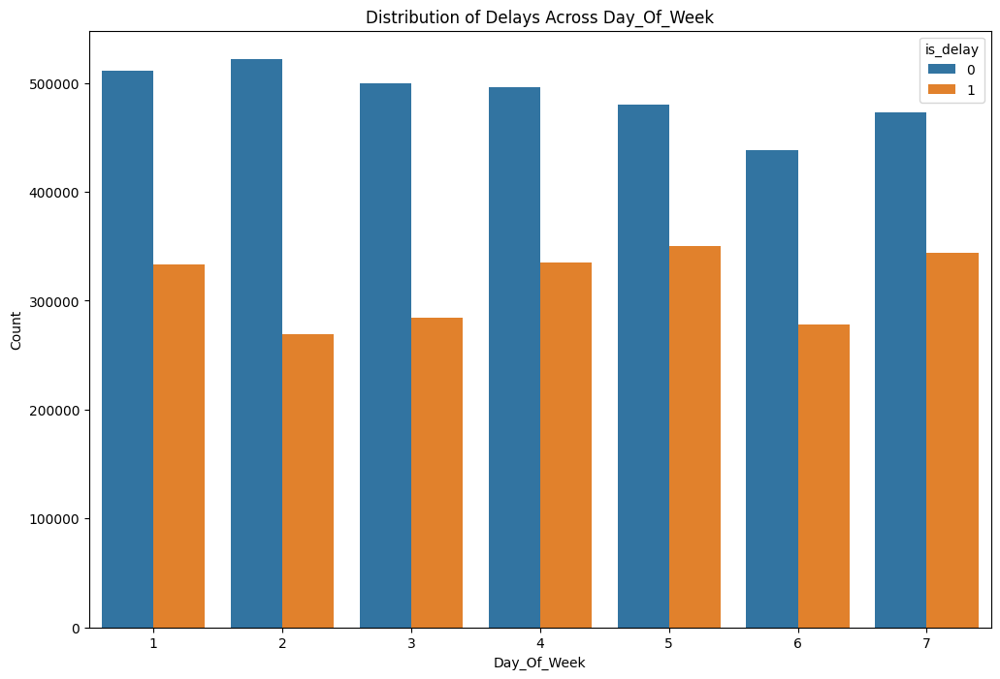

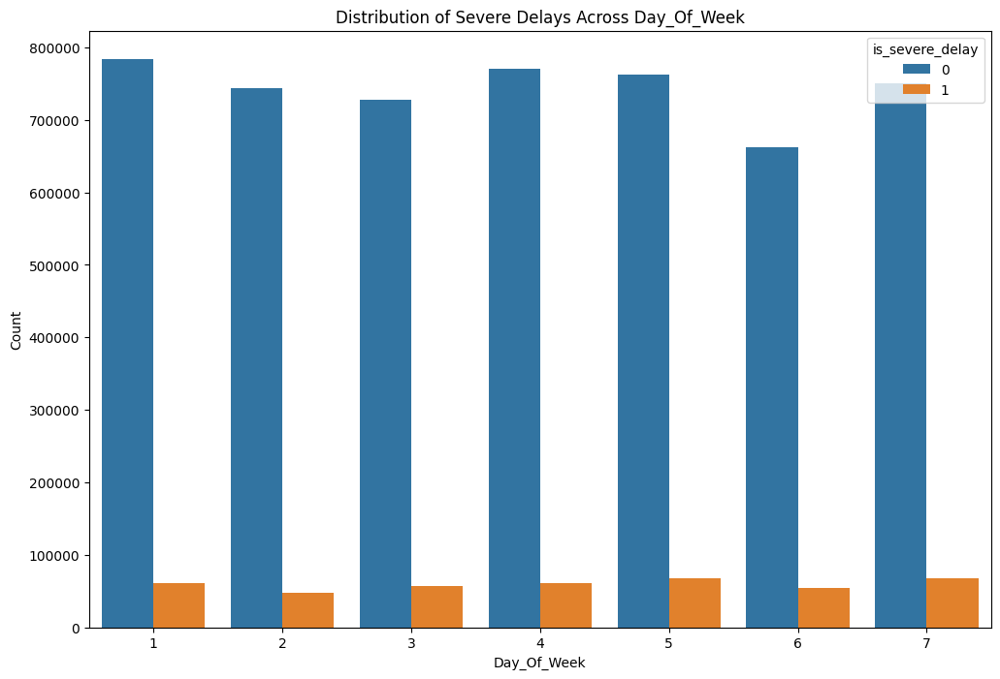

In [ ]:
plot_delay_charts('Day_Of_Week')

Even distribution of day of week, we should drop this feature.

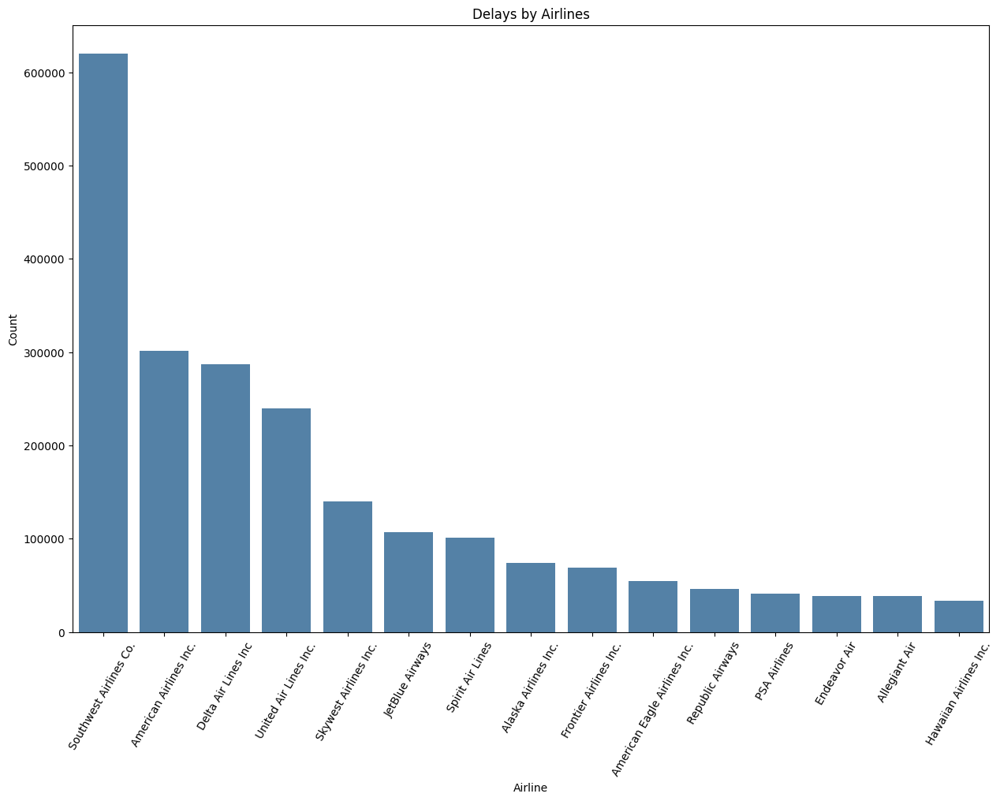

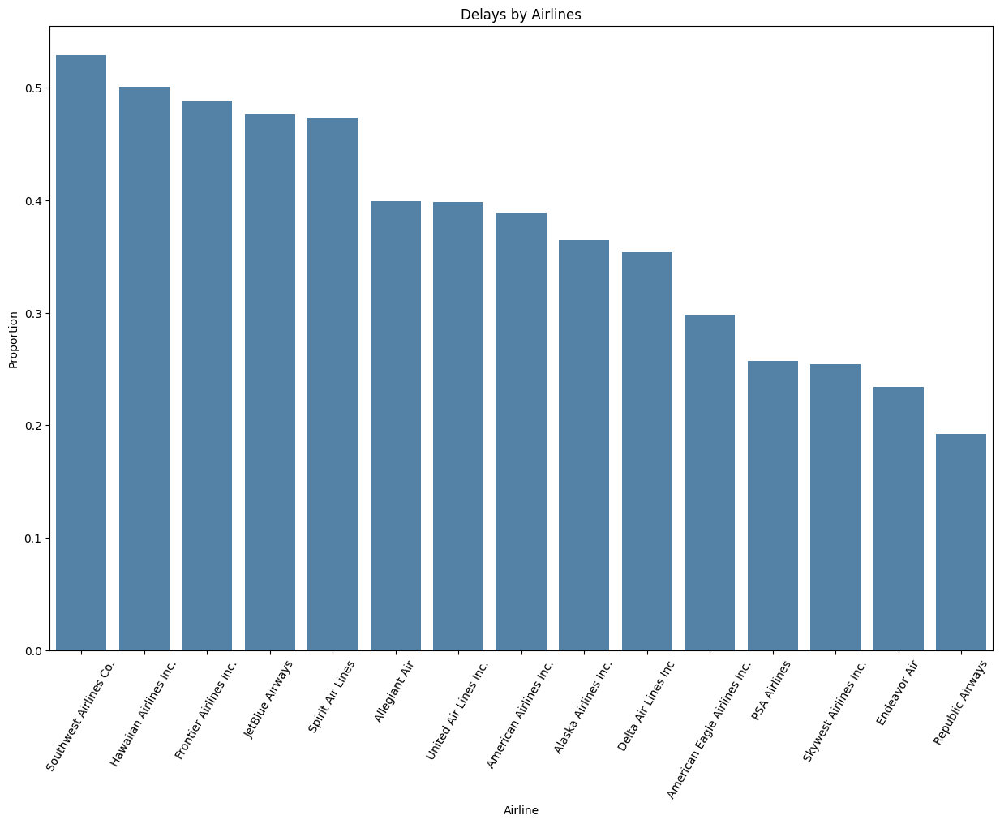

In [ ]:
# Explore distribution of count of delays for Airline for delayed departures
airlines = flights_df.groupby('Airline')['is_delay'].value_counts().rename('count_flights_severe_delayed').reset_index()
airlines = airlines.sort_values(by='count_flights_severe_delayed', ascending=False)
airlines = airlines[airlines['is_delay'] == 1]

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Airline', y='count_flights_severe_delayed', data=airlines, color='steelblue')
plt.xlabel('Airline')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.ylabel('Count')
plt.title('Delays by Airlines')
plt.show()

# distribution for proportion of delays
airlines = flights_df.groupby('Airline')['is_delay'].value_counts(normalize=True).rename('ratio_of_flights_delayed').reset_index()
airlines = airlines.sort_values(by='ratio_of_flights_delayed', ascending=False)

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Airline', y='ratio_of_flights_delayed', data=airlines[airlines['is_delay'] == 1], color='steelblue')
plt.xlabel('Airline')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.ylabel('Proportion')
plt.title('Delays by Airlines')
plt.show()

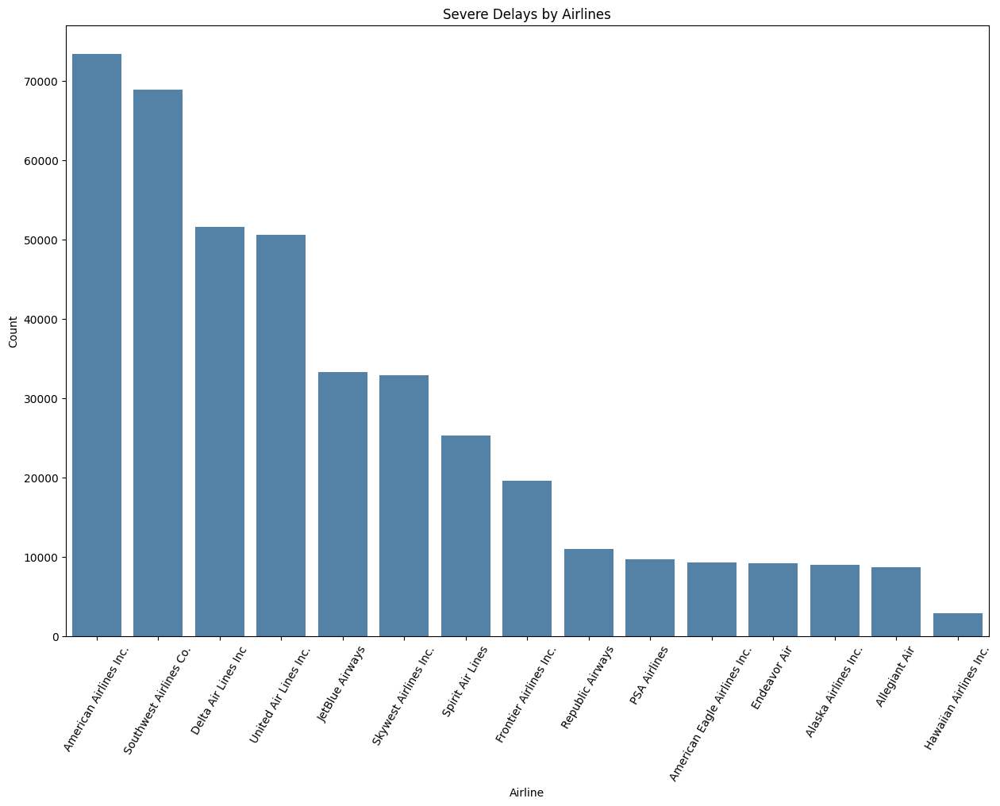

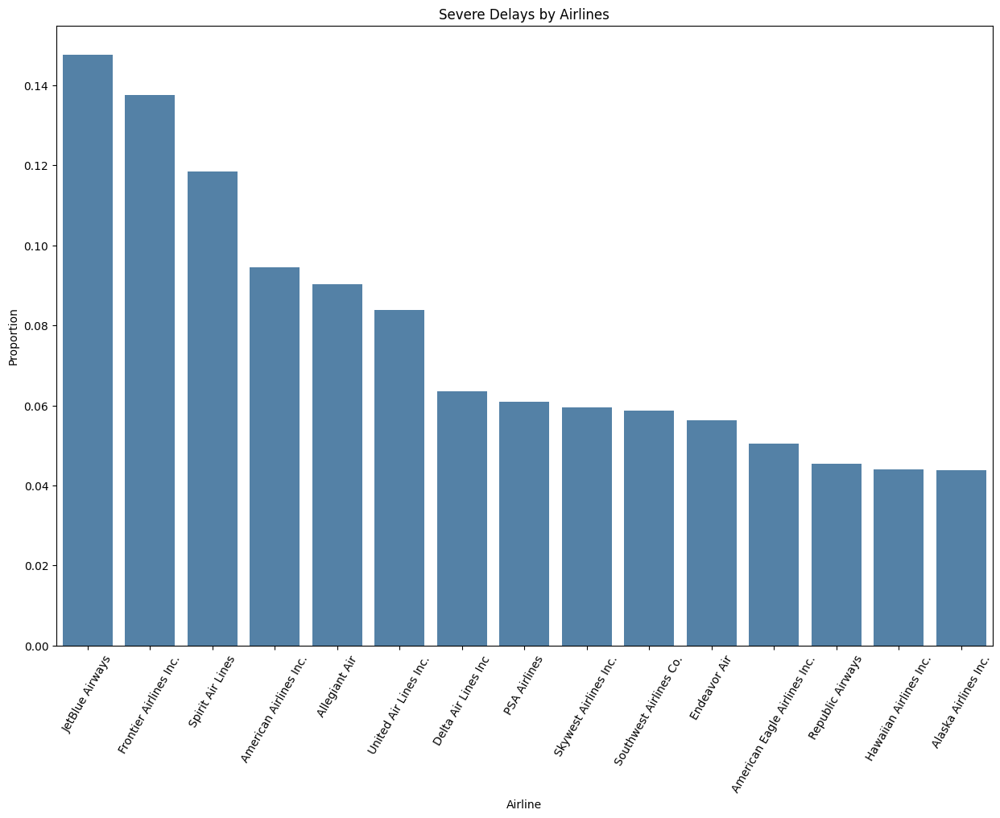

In [ ]:
# Explore count distribution
airlines_count = flights_df.groupby('Airline')['is_severe_delay'].value_counts().rename('count_flights_severe_delayed').reset_index()
airlines_count = airlines_count.sort_values(by='count_flights_severe_delayed', ascending=False)
airlines_count = airlines_count[airlines_count['is_severe_delay'] == 1]
total_count = airlines_count['count_flights_severe_delayed'].sum()

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Airline', y='count_flights_severe_delayed', data=airlines_count, color='steelblue')
plt.xlabel('Airline')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.ylabel('Count')
plt.title('Severe Delays by Airlines')
plt.show()


# Explore proportion distribution
airlines_prop = flights_df.groupby('Airline')['is_severe_delay'].value_counts(normalize=True).rename('ratio_of_flights_delayed').reset_index()
airlines_prop = airlines_prop.sort_values(by='ratio_of_flights_delayed', ascending=False)
airlines_prop = airlines_prop[airlines_prop['is_severe_delay'] == 1]

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Airline', y='ratio_of_flights_delayed', data=airlines_prop, color='steelblue')
plt.xlabel('Airline')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.ylabel('Proportion')
plt.title('Severe Delays by Airlines')
plt.show()

In [ ]:
num_airlines = len(airlines_prop['Airline'].tolist())


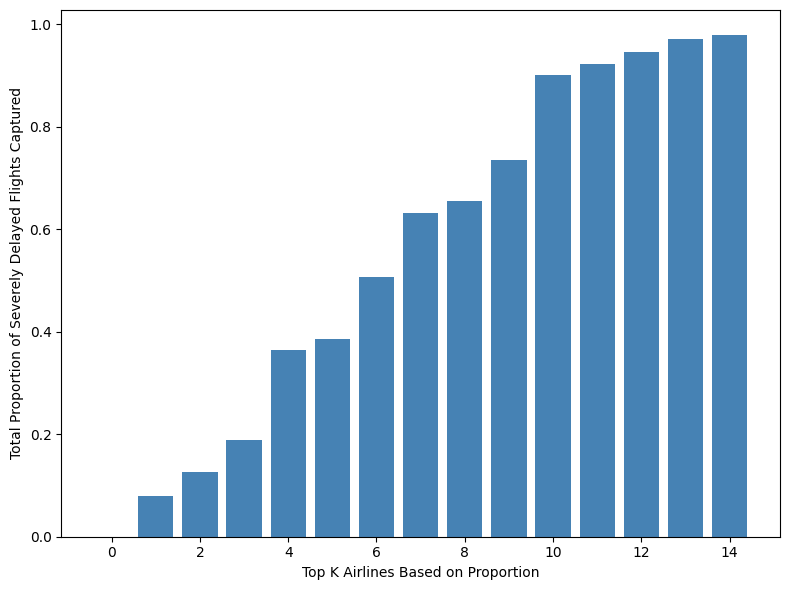

In [ ]:
res = []

for top_k in range(num_airlines):
    top_k_airlines = airlines_prop['Airline'].head(top_k).tolist()
    filtered_count = airlines_count[airlines_count['Airline'].isin(top_k_airlines)]

    total_severe_delays = filtered_count['count_flights_severe_delayed'].sum()
    prop_captured = total_severe_delays/total_count
    res.append([top_k, prop_captured])

res = pd.DataFrame(res, columns=['K', 'Proportion'], index=None)

plt.figure(figsize=(8, 6))
plt.bar(res['K'], res['Proportion'], color='steelblue')
plt.xlabel('Top K Airlines Based on Proportion')
plt.ylabel('Total Proportion of Severely Delayed Flights Captured')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
res.head(10)

,K,Proportion
0,0,0.000000
1,1,0.080110
2,2,0.127184
3,3,0.188058
4,4,0.364690
5,5,0.385571
6,6,0.507382
7,7,0.631717
8,8,0.655004
9,9,0.734238


Note the above 2 charts representing airlines against any delay and severe delays, where the names of airlines that appear are slightly different. Nevertheless, we stick to severe delays as that is our business context.

We have 2 visualisations, one on airlines against count of flights severely delayed, and the other based on proportion. Do note these lists do not tally up, eg. American Airlines has the greatest severely delayed flights but does not have the greatest corresponding proportion; vice versa forJetBlue.

We see that some airlines are more prone to delays. We can reduce dimensionality by grouping the Top K Airlines individually, and all other airlines into an 'Others' category. Here, we select the Top 7 which captures 63% of the total severely delayed flights, where airlines Delta Air Lines Inc onwards are bundled together as 'Others'. We would do this step later on under Feature Engineering.

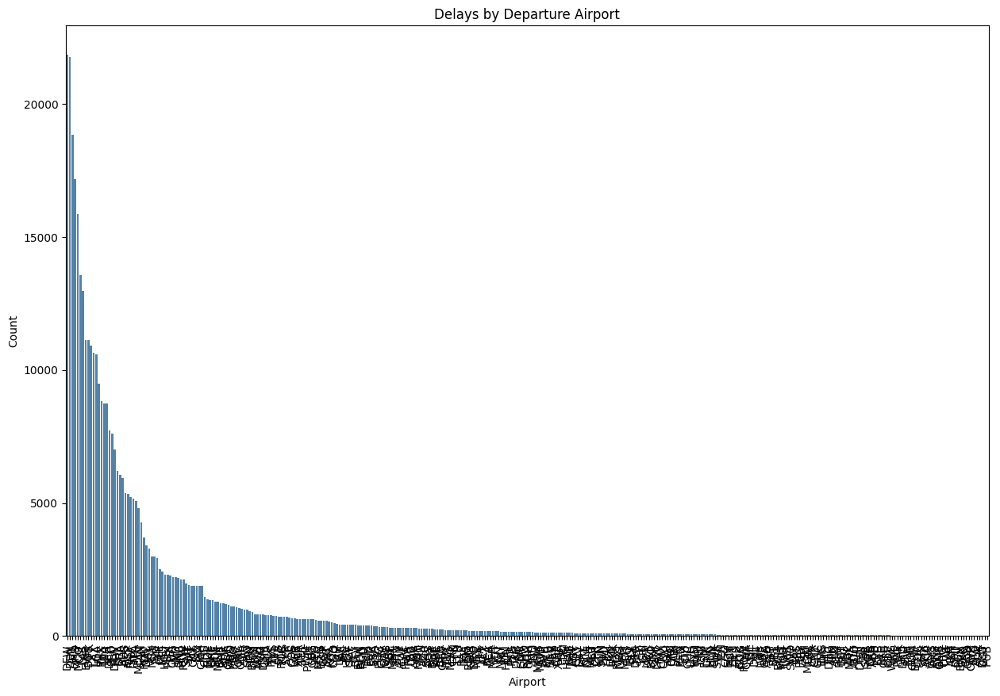

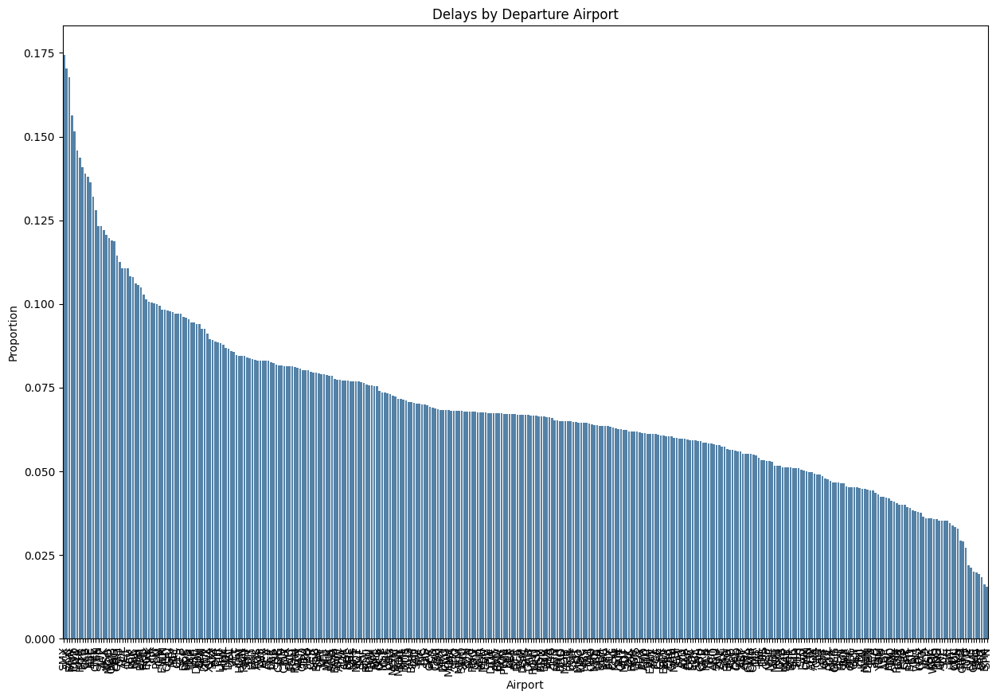

In [ ]:
# Explore count distribution Departure Airport for delayed departures
dep_airports_count = flights_df.groupby('Dep_Airport')['is_severe_delay'].value_counts().rename('count_flights_severe_delayed').reset_index()
dep_airports_count = dep_airports_count.sort_values(by='count_flights_severe_delayed', ascending=False)
dep_airports_count = dep_airports_count[dep_airports_count['is_severe_delay'] == 1]
total_count = dep_airports_count['count_flights_severe_delayed'].sum()

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Dep_Airport', y='count_flights_severe_delayed', data=dep_airports_count, color='steelblue')
plt.xlabel('Airport')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Count')
plt.title('Delays by Departure Airport')
plt.show()

# Explore proportion distribution
dep_airports = flights_df.groupby('Dep_Airport')['is_severe_delay'].value_counts(normalize=True).rename('ratio_of_flights_delayed').reset_index()
dep_airports = dep_airports.sort_values(by='ratio_of_flights_delayed', ascending=False)
dep_airports = dep_airports[dep_airports['is_severe_delay'] == 1]

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Dep_Airport', y='ratio_of_flights_delayed', data=dep_airports, color='steelblue')
plt.xlabel('Airport')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Proportion')
plt.title('Delays by Departure Airport')
plt.show()

In [ ]:
num_airports = len(dep_airports['Dep_Airport'].tolist())
num_airports

349

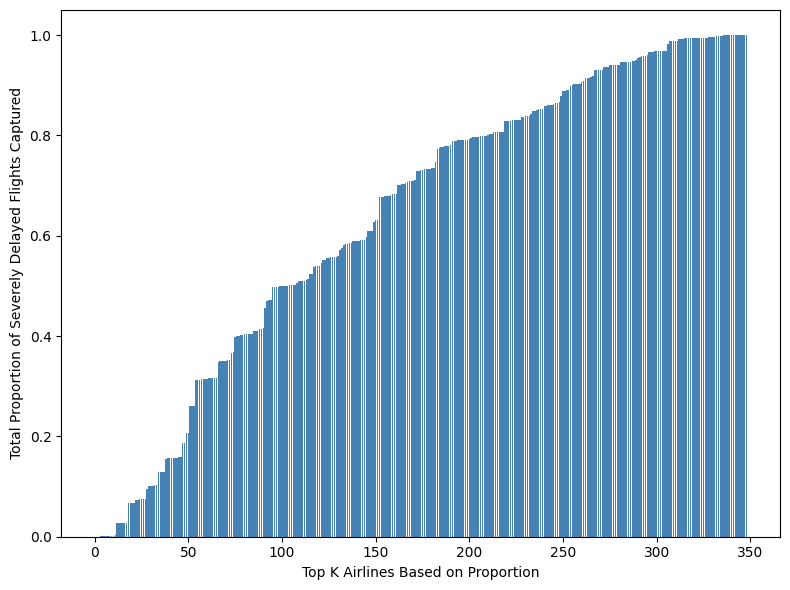

In [ ]:
res = []

for top_k in range(num_airports):
    top_k_airlines = dep_airports['Dep_Airport'].head(top_k).tolist()
    filtered_count = dep_airports_count[dep_airports_count['Dep_Airport'].isin(top_k_airlines)]

    total_severe_delays = filtered_count['count_flights_severe_delayed'].sum()
    prop_captured = total_severe_delays/total_count
    res.append([top_k, prop_captured])

res = pd.DataFrame(res, columns=['K', 'Proportion'], index=None)

plt.figure(figsize=(8, 6))
plt.bar(res['K'], res['Proportion'], color='steelblue')
plt.xlabel('Top K Airlines Based on Proportion')
plt.ylabel('Total Proportion of Severely Delayed Flights Captured')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
thresholds = np.arange(0,1,0.1).round(1)
results_df = pd.DataFrame(columns=['Proportion Captured', 'K'])

for threshold in thresholds:
  # Find the first index where 'Proportion' is greater than the threshold
  first_above_threshold = res[res['Proportion'] > threshold].index[0]
  k_value = res.loc[first_above_threshold, 'K']
  results_df = results_df.append({'Proportion Captured': threshold, 'K': k_value}, ignore_index=True)

results_df

,Proportion Captured,K
0,0.0,1.0
1,0.1,29.0
2,0.2,49.0
3,0.3,54.0
4,0.4,76.0
5,0.5,102.0
6,0.6,146.0
7,0.7,162.0
8,0.8,211.0
9,0.9,255.0


We see there are many airports involved and we observe a general skewed distribution in flight delays towards some airports. Hence, for our analysis we take only the top 50 departure airports.

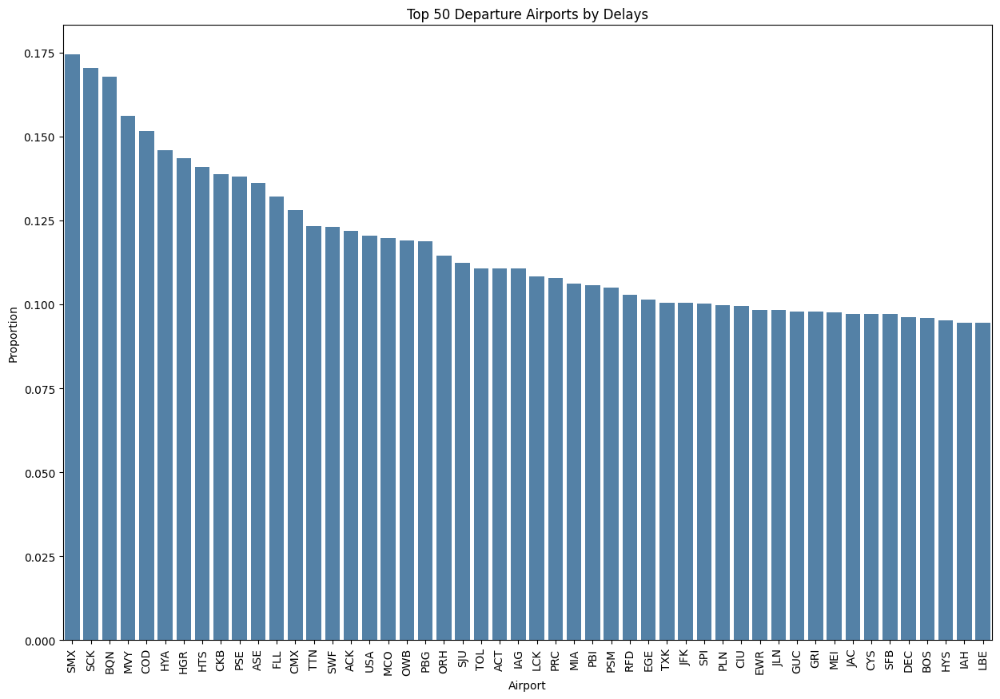

In [ ]:
TOP_K_AIRPORTS = 50

# Explore distribution Departure Airport for delayed departures
plt.figure(figsize=(15, 10))

dep_airports = flights_df.groupby('Dep_Airport')['is_severe_delay'].value_counts(normalize=True).rename('ratio_of_flights_delayed').reset_index()
dep_airports = dep_airports.sort_values(by='ratio_of_flights_delayed', ascending=False)
dep_airports = dep_airports[dep_airports['is_severe_delay'] == 1]

ax = sns.barplot(x='Dep_Airport', y='ratio_of_flights_delayed', data=dep_airports.head(TOP_K_AIRPORTS), color='steelblue')
plt.xlabel('Airport')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Proportion')
plt.title(f"Top {TOP_K_AIRPORTS} Departure Airports by Delays")
plt.show()

Top 5 Departure Airports with > 15% delays for the 1st 10 months of 2023:
- Santa Maria Public Airport (SMX)
- Stockton Metropolitan Airport (SCK)
- Rafael Hernández International Airport (BQN)
- Martha's Vineyard Airport (MVY)
- Yellowstone Regional Airport (COD)

In [ ]:
# Take only the top 50 departure airports
dep_airports = dep_airports.head(TOP_K_AIRPORTS)

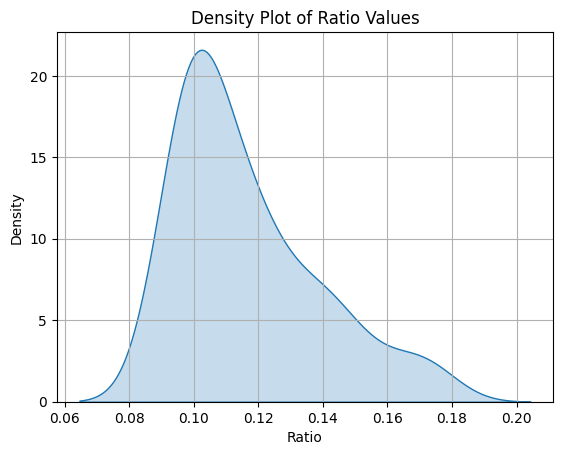

In [ ]:
sns.kdeplot(dep_airports['ratio_of_flights_delayed'], fill=True)
plt.title('Density Plot of Ratio Values')
plt.xlabel('Ratio')
plt.ylabel('Density')
plt.grid(True)
plt.show()

Can we use the ratio as quantitaive description of the airport infrastructure and geographic location?

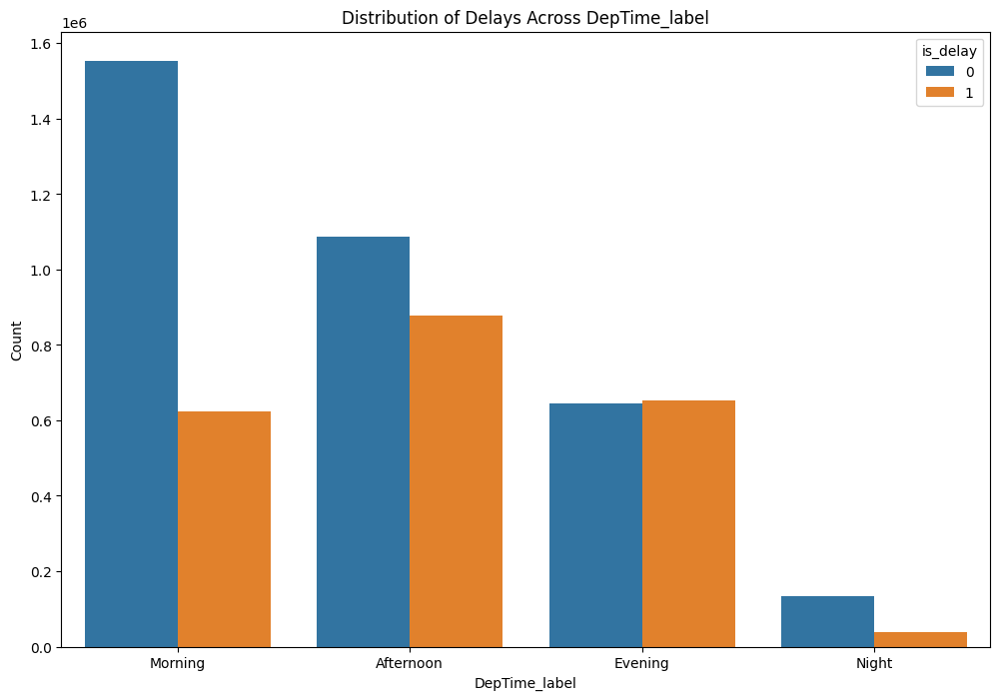

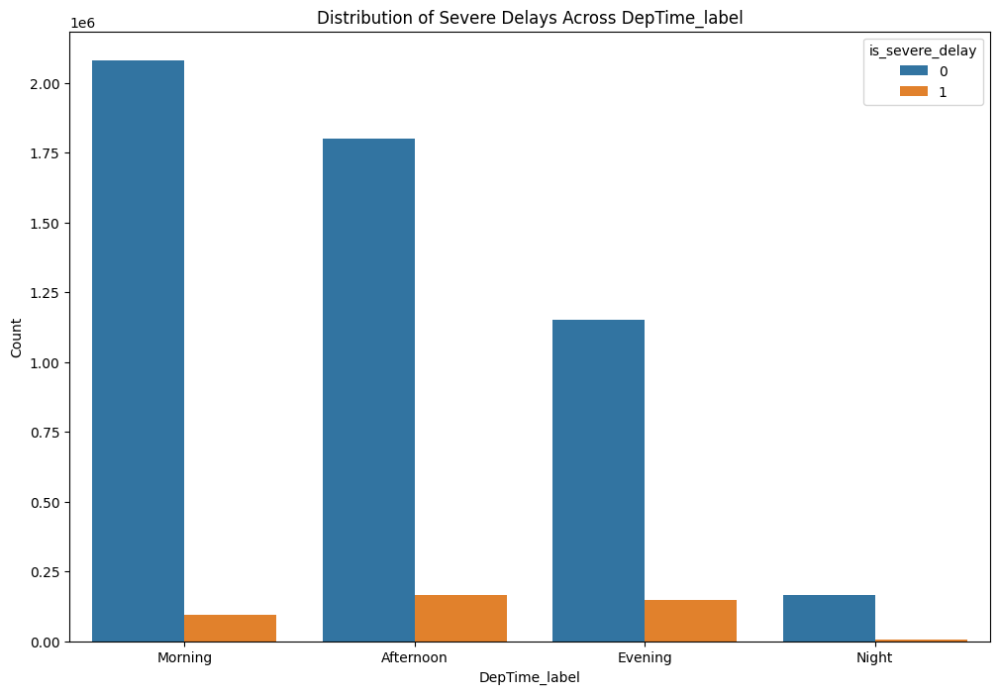

In [ ]:
plot_delay_charts('DepTime_label')

Occurence of any delays seem to happen most often in the afternoon and evenings, same observation too for severe delays.

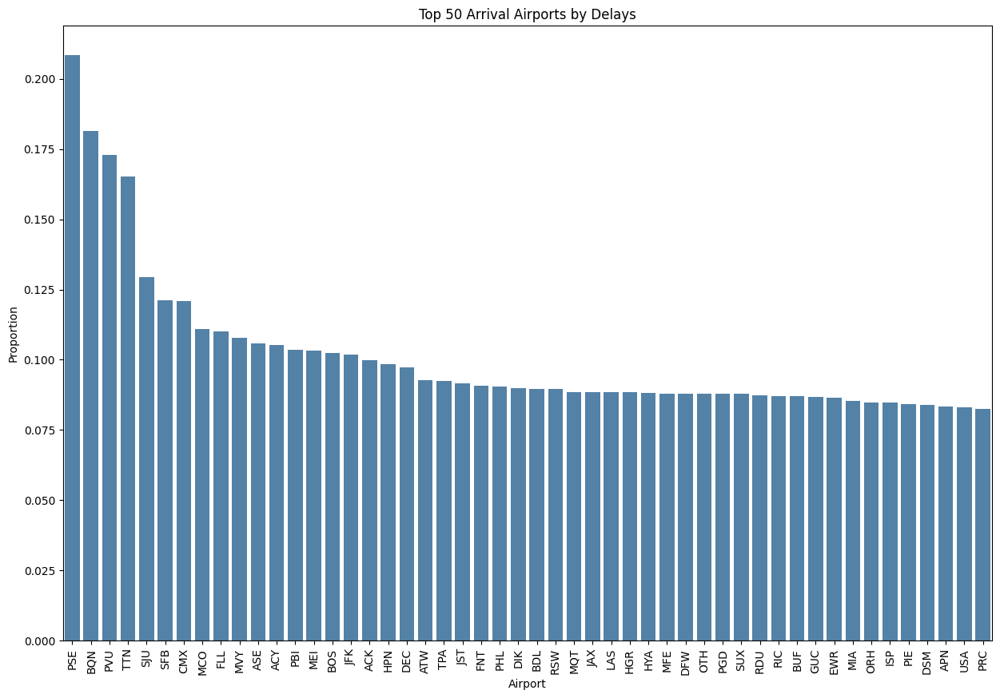

In [ ]:
# Explore distribution Arrival Airport for delayed departures
plt.figure(figsize=(15, 10))

arr_airpots = flights_df.groupby('Arr_Airport')['is_severe_delay'].value_counts(normalize=True).rename('ratio_of_dep_delayed').reset_index()
arr_airpots = arr_airpots.sort_values(by='ratio_of_dep_delayed', ascending=False)
arr_airpots = arr_airpots[arr_airpots['is_severe_delay'] == 1]

# Take only the top 50 arrival airports
arr_airpots = arr_airpots.head(50)

ax = sns.barplot(x='Arr_Airport', y='ratio_of_dep_delayed', data=arr_airpots, color='steelblue')
plt.xlabel('Airport')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Proportion')
plt.title('Top 50 Arrival Airports by Delays')
plt.show()

Top 4 Arrival Airports with > 15% delays for the 1st 10 months of 2023:
- Mercedita International Airport (PSE)
- Rafael Hernández International Airport (BQN)
- Provo Municipal Airport (PVU)
- Trenton–Mercer Airport (TTN)

Do note we are not so concerned with this data as we are focused on departure related delays.

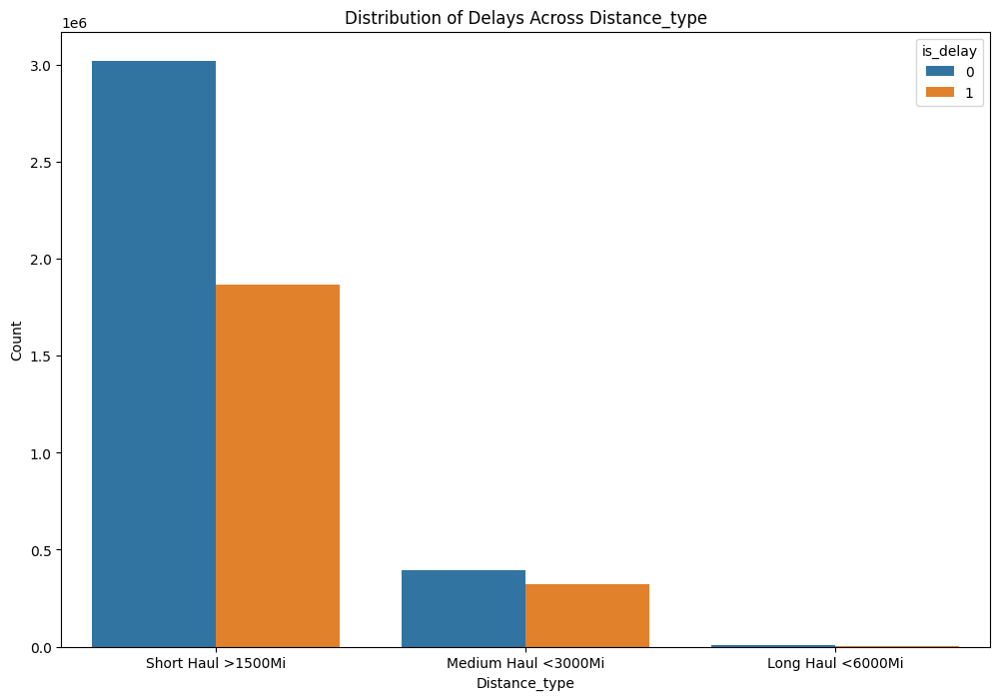

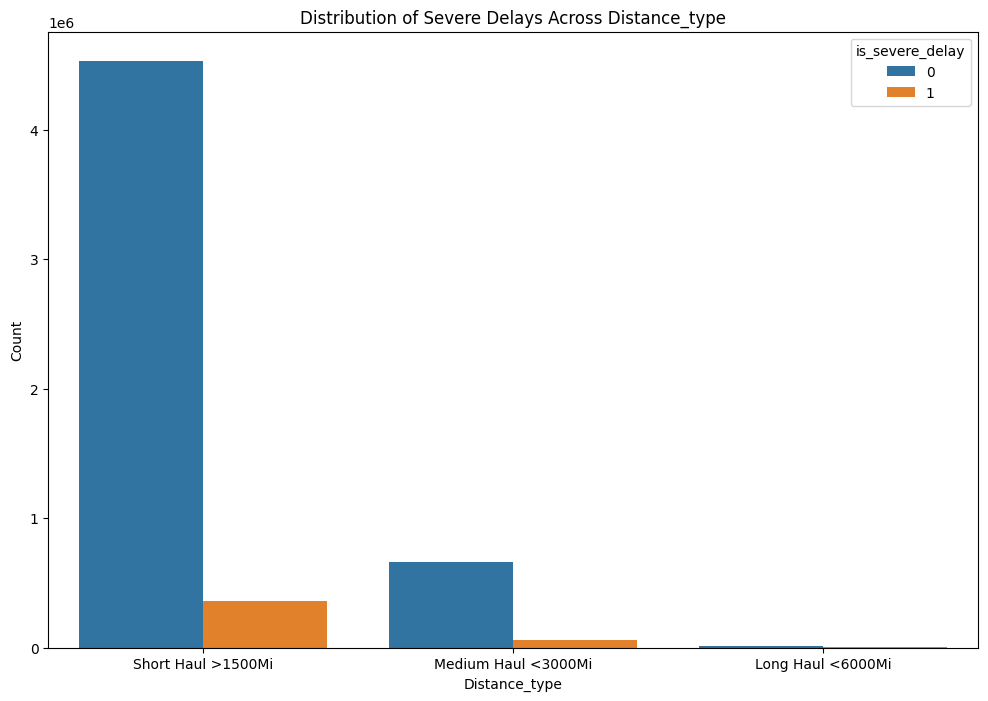

In [ ]:
plot_delay_charts('Distance_type')

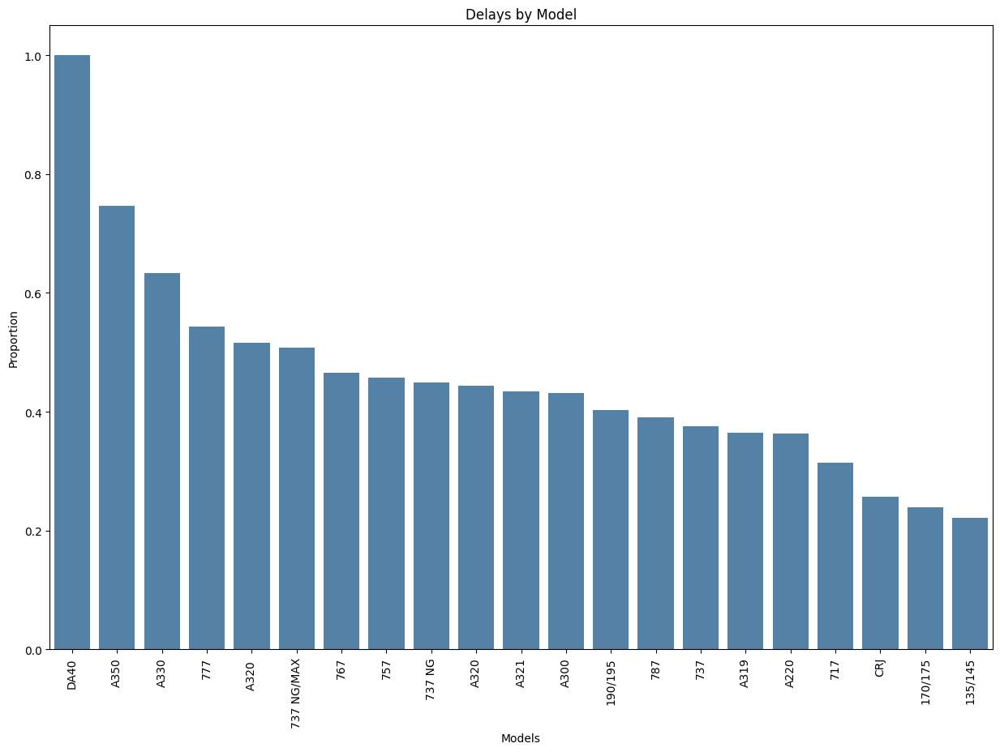

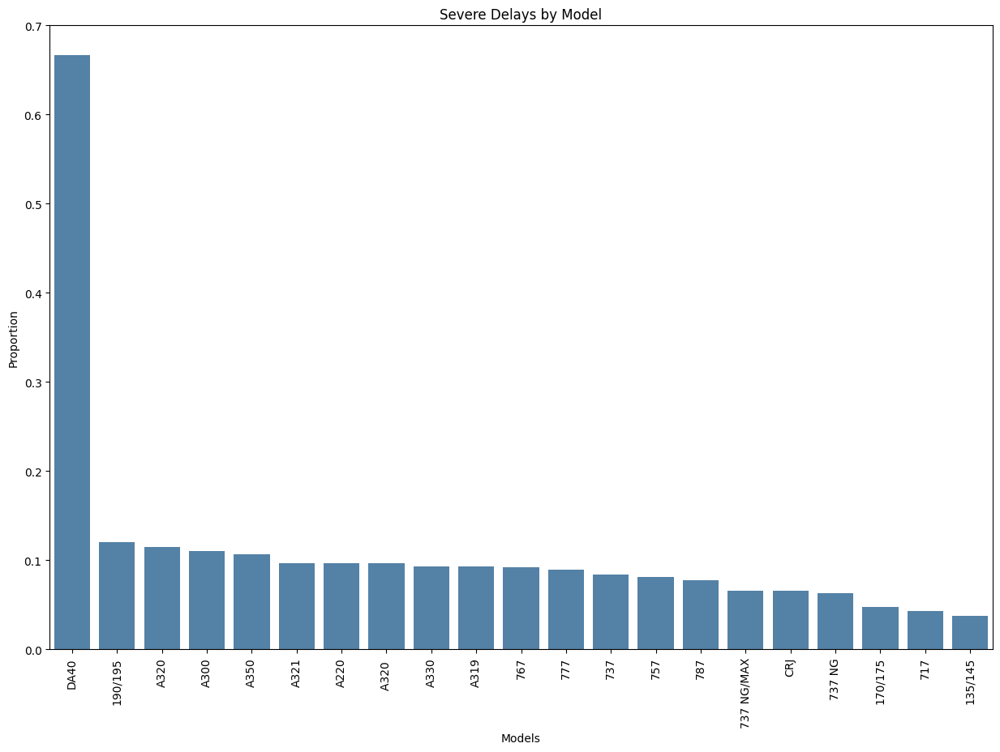

In [ ]:
# Explore distribution Arrival Airport for delayed departures
models = flights_df.groupby('Model')['is_delay'].value_counts(normalize=True).rename('ratio_of_dep_delayed').reset_index()
models = models.sort_values(by='ratio_of_dep_delayed', ascending=False)
models = models[models['is_delay'] == 1]

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Model', y='ratio_of_dep_delayed', data=models, color='steelblue')
plt.xlabel('Models')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Proportion')
plt.title('Delays by Model')
plt.show()


# Explore distribution Arrival Airport for severe delayed departures
models = flights_df.groupby('Model')['is_severe_delay'].value_counts(normalize=True).rename('ratio_of_dep_delayed').reset_index()
models = models.sort_values(by='ratio_of_dep_delayed', ascending=False)
models = models[models['is_severe_delay'] == 1]

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='Model', y='ratio_of_dep_delayed', data=models, color='steelblue')
plt.xlabel('Models')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.ylabel('Proportion')
plt.title('Severe Delays by Model')
plt.show()

Something wrong with DA40

Text(0.5, 0.98, 'Aircraft Age vs Severe Delay')

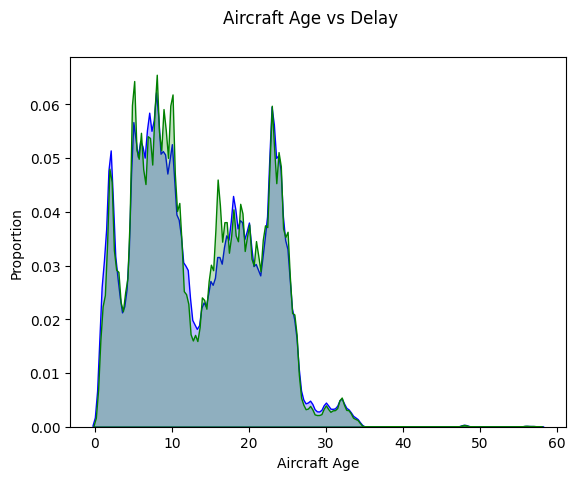

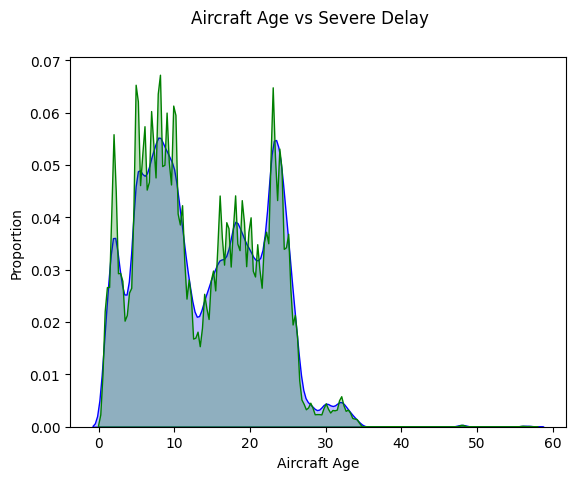

In [ ]:
fig, ax = plt.subplots()
sns.kdeplot(flights_df[flights_df['is_delay']==1]['Aicraft_age'], shade=True, color="blue", label="Delay", ax=ax)
sns.kdeplot(flights_df[flights_df['is_delay']==0]['Aicraft_age'], shade=True, color="green", label="Normal", ax=ax)
ax.set_xlabel("Aircraft Age")
ax.set_ylabel("Proportion")
fig.suptitle("Aircraft Age vs Delay")

fig, ax = plt.subplots()
sns.kdeplot(flights_df[flights_df['is_severe_delay']==1]['Aicraft_age'], shade=True, color="blue", label="Severe Delay", ax=ax)
sns.kdeplot(flights_df[flights_df['is_severe_delay']==0]['Aicraft_age'], shade=True, color="green", label="Normal", ax=ax)
ax.set_xlabel("Aircraft Age")
ax.set_ylabel("Proportion")
fig.suptitle("Aircraft Age vs Severe Delay")

## 1.2. Weather

In [ ]:
weather_path = "weather_meteo_by_airport.csv"

df_weather = pd.read_csv(weather_path)
df_weather = df_weather.rename(columns={'time': 'FlightDate'})
df_weather['FlightDate'] = pd.to_datetime(df_weather['FlightDate'])
df_weather.head(10)

,FlightDate,tavg,tmin,tmax,prcp,snow,wdir,wspd,pres,airport_id
0,2023-01-01,8.1,2.2,11.7,0.0,0.0,278.0,9.7,1013.8,ABE
1,2023-01-02,5.4,0.0,11.7,0.0,0.0,353.0,3.6,1019.6,ABE
2,2023-01-03,8.4,7.2,9.4,15.2,0.0,50.0,5.0,1013.9,ABE
3,2023-01-04,11.1,6.7,17.2,0.0,0.0,302.0,4.7,1009.8,ABE
4,2023-01-05,12.7,6.7,14.4,7.9,0.0,292.0,7.2,1013.0,ABE
5,2023-01-06,5.8,2.8,7.2,5.8,0.0,308.0,9.0,1016.6,ABE
6,2023-01-07,3.8,1.7,6.7,0.0,0.0,285.0,11.2,1022.2,ABE
7,2023-01-08,2.2,-2.7,3.9,0.0,0.0,346.0,6.8,1024.5,ABE
8,2023-01-09,2.3,-1.0,5.0,0.0,0.0,271.0,11.9,1015.2,ABE
9,2023-01-10,1.9,-1.6,4.4,0.0,0.0,250.0,9.4,1017.4,ABE


# 2. Feature Engineering

## 2.1 Explaining the Feature Engineering Process

In [ ]:
df = flights_df.copy()
df

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Arr_Airport,Arr_CityName,Flight_Duration,Distance_type,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay,month
0,2023-01-02,1,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",56,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1
1,2023-01-03,2,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",62,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1
2,2023-01-04,3,Endeavor Air,N331PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",49,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1
3,2023-01-05,4,Endeavor Air,N906XJ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",54,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,17,0,0,1
4,2023-01-06,5,Endeavor Air,N337PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",50,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5614045,2023-10-24,2,Republic Airways,N203JQ,LGA,"New York, NY",Evening,CMH,"Columbus, OH",101,Short Haul >1500Mi,EMBRAER,170/175,16,0,0,10
5614046,2023-10-24,2,Republic Airways,N882RW,PIT,"Pittsburgh, PA",Morning,LGA,"New York, NY",71,Short Haul >1500Mi,EMBRAER,170/175,16,0,0,10
5614047,2023-10-24,2,Republic Airways,N210JQ,BOS,"Boston, MA",Morning,DCA,"Washington, DC",104,Short Haul >1500Mi,EMBRAER,170/175,16,0,0,10
5614048,2023-10-24,2,Republic Airways,N218JQ,LGA,"New York, NY",Afternoon,BOS,"Boston, MA",61,Short Haul >1500Mi,EMBRAER,170/175,17,0,0,10


1. Reduce dimensionality by limiting the number of Airlines

As discussed above, we select the Top 7 airlines ranked in terms of proportion of severely delayed flights, which captures 63% of all severely delayed flights overall.

In [ ]:
TOP_K = 7

# Airline to focus only on the Airlines with higher
airlines = flights_df.groupby('Airline')['is_severe_delay'].value_counts(normalize=True).rename('ratio_of_flights_delayed').reset_index()
airlines = airlines.sort_values(by='ratio_of_flights_delayed', ascending=False)
top_airlines = list(airlines[airlines['is_severe_delay'] == 1].head(TOP_K)['Airline'])

# Replace values not in 'top_airlines' with 'Others'
df['Airline'] = df['Airline'].apply(lambda x: x if x in top_airlines else 'Others')
df['Airline'].unique()

array(['Others', 'American Airlines Inc.', 'JetBlue Airways',
       'Delta Air Lines Inc', 'Frontier Airlines Inc.', 'Allegiant Air',
       'Spirit Air Lines', 'United Air Lines Inc.'], dtype=object)

2. Create a feature to indicate if model is DA40

In [ ]:
df['isDA40'] = (df['Model'] == 'DA40').astype(int)
df.head()

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Arr_Airport,Arr_CityName,Flight_Duration,Distance_type,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay,month,isDA40
0,2023-01-02,1,Others,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",56,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1,0
1,2023-01-03,2,Others,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",62,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1,0
2,2023-01-04,3,Others,N331PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",49,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1,0
3,2023-01-05,4,Others,N906XJ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",54,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,17,0,0,1,0
4,2023-01-06,5,Others,N337PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",50,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1,0


3. Assign delay probability based on past data to departure airport

In [ ]:
dep_airports = flights_df.groupby('Dep_Airport')['is_severe_delay'].value_counts(normalize=True).rename('dep_airport_ratio').reset_index()
dep_airports = dep_airports.sort_values(by='dep_airport_ratio', ascending=False)
dep_airports = dep_airports[dep_airports['is_severe_delay'] == 1]
dep_airports_sub = dep_airports[['Dep_Airport', 'dep_airport_ratio']]

df = pd.merge(df, dep_airports_sub, on='Dep_Airport', how='inner')
df

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Arr_Airport,Arr_CityName,Flight_Duration,Distance_type,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay,month,isDA40,dep_airport_ratio
0,2023-01-02,1,Others,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",56,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1,0,0.077068
1,2023-01-03,2,Others,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",62,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1,0,0.077068
2,2023-01-04,3,Others,N331PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",49,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1,0,0.077068
3,2023-01-05,4,Others,N906XJ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",54,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,17,0,0,1,0,0.077068
4,2023-01-06,5,Others,N337PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",50,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1,0,0.077068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5614045,2023-08-10,4,Others,N618AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",22,Short Haul >1500Mi,BOEING,737 NG,24,1,1,8,0,0.040000
5614046,2023-08-11,5,Others,N612AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",25,Short Haul >1500Mi,BOEING,737 NG,25,0,0,8,0,0.040000
5614047,2023-08-12,6,Others,N644AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",35,Short Haul >1500Mi,BOEING,737 NG,21,0,0,8,0,0.040000
5614048,2023-08-13,7,Others,N622AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",39,Short Haul >1500Mi,BOEING,737 NG,24,0,0,8,0,0.040000


## 2.1.2. Weather Feature Engineering

In [ ]:
# feature engineering
TAKEOFF_DRY_LIMIT = 33*1.852
TAKEOFF_WET_LIMIT = 27*1.852

# 0 for freezing since we are in Celsius measurement scale
df_weather['is_below_freezing'] = df_weather['tavg'].apply(lambda x: x < 0).astype(int)
df_weather['is_max_below_freezing'] = df_weather['tmax'].apply(lambda x: x < 0).astype(int)

df_weather['is_prcp'] = df_weather['prcp'].apply(lambda x: x > 0).astype(int)
df_weather['is_snow'] = df_weather['snow'].apply(lambda x: x > 0).astype(int)

df_weather['is_exceed_wind_limit'] = df_weather.apply(lambda row: row['wspd'] >= TAKEOFF_WET_LIMIT if row['is_prcp'] else row['wspd'] >= TAKEOFF_DRY_LIMIT, axis=1).astype(int)
df_weather.head()

,FlightDate,tavg,tmin,tmax,prcp,snow,wdir,wspd,pres,airport_id,is_below_freezing,is_max_below_freezing,is_prcp,is_snow,is_exceed_wind_limit
0,2023-01-01,8.1,2.2,11.7,0.0,0.0,278.0,9.7,1013.8,ABE,0,0,0,0,0
1,2023-01-02,5.4,0.0,11.7,0.0,0.0,353.0,3.6,1019.6,ABE,0,0,0,0,0
2,2023-01-03,8.4,7.2,9.4,15.2,0.0,50.0,5.0,1013.9,ABE,0,0,1,0,0
3,2023-01-04,11.1,6.7,17.2,0.0,0.0,302.0,4.7,1009.8,ABE,0,0,0,0,0
4,2023-01-05,12.7,6.7,14.4,7.9,0.0,292.0,7.2,1013.0,ABE,0,0,1,0,0


In [ ]:
df_depart_weather = df_weather.copy()

df_depart_weather = df_depart_weather.rename(columns=lambda x: f'dep_{x}')
df_depart_weather = df_depart_weather.rename(columns={'dep_airport_id': 'Dep_Airport', 'dep_FlightDate': 'FlightDate'})
df_depart_weather

,FlightDate,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,Dep_Airport,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
0,2023-01-01,8.1,2.2,11.7,0.0,0.0,278.0,9.7,1013.8,ABE,0,0,0,0,0
1,2023-01-02,5.4,0.0,11.7,0.0,0.0,353.0,3.6,1019.6,ABE,0,0,0,0,0
2,2023-01-03,8.4,7.2,9.4,15.2,0.0,50.0,5.0,1013.9,ABE,0,0,1,0,0
3,2023-01-04,11.1,6.7,17.2,0.0,0.0,302.0,4.7,1009.8,ABE,0,0,0,0,0
4,2023-01-05,12.7,6.7,14.4,7.9,0.0,292.0,7.2,1013.0,ABE,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132855,2023-12-27,12.2,6.7,17.6,0.0,0.0,30.0,9.6,1021.0,YUM,0,0,0,0,0
132856,2023-12-28,12.8,6.7,21.0,0.0,0.0,12.0,11.1,1020.6,YUM,0,0,0,0,0
132857,2023-12-29,13.6,7.0,20.2,0.0,0.0,22.0,13.7,1020.0,YUM,0,0,0,0,0
132858,2023-12-30,13.6,7.0,21.0,0.0,0.0,337.0,11.2,1016.5,YUM,0,0,0,0,0


In [ ]:
# Merge
df = pd.merge(df, df_depart_weather, on=['Dep_Airport', 'FlightDate'], how='left')
df

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Arr_Airport,Arr_CityName,Flight_Duration,Distance_type,Manufacturer,Model,Aicraft_age,is_delay,is_severe_delay,month,isDA40,dep_airport_ratio,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
0,2023-01-02,1,Others,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",56,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1,0,0.077068,2.9,-2.1,8.3,0.0,0.0,338.0,3.2,1019.1,0,0,0,0,0
1,2023-01-03,2,Others,N605LR,BDL,"Hartford, CT",Morning,LGA,"New York, NY",62,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,16,0,0,1,0,0.077068,1.8,-1.6,4.4,10.7,0.0,3.0,3.6,1015.2,0,0,1,0,0
2,2023-01-04,3,Others,N331PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",49,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1,0,0.077068,5.2,3.9,8.3,6.6,0.0,1.0,7.2,1011.1,0,0,1,0,0
3,2023-01-05,4,Others,N906XJ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",54,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,17,0,0,1,0,0.077068,6.8,3.9,7.8,0.8,0.0,14.0,13.7,1014.8,0,0,1,0,0
4,2023-01-06,5,Others,N337PQ,BDL,"Hartford, CT",Morning,LGA,"New York, NY",50,Short Haul >1500Mi,CANADAIR REGIONAL JET,CRJ,10,0,0,1,0,0.077068,3.3,0.0,3.9,9.7,0.0,0.0,5.8,1016.1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5614045,2023-08-10,4,Others,N618AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",22,Short Haul >1500Mi,BOEING,737 NG,24,1,1,8,0,0.040000,15.0,5.6,15.6,4.1,0.0,125.0,8.3,1009.3,0,0,1,0,0
5614046,2023-08-11,5,Others,N612AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",25,Short Haul >1500Mi,BOEING,737 NG,25,0,0,8,0,0.040000,14.9,3.9,16.1,7.9,0.0,36.0,4.7,1012.0,0,0,1,0,0
5614047,2023-08-12,6,Others,N644AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",35,Short Haul >1500Mi,BOEING,737 NG,21,0,0,8,0,0.040000,14.9,12.2,17.8,8.4,0.0,119.0,14.8,1011.0,0,0,1,0,0
5614048,2023-08-13,7,Others,N622AS,GST,"Gustavus, AK",Afternoon,JNU,"Juneau, AK",39,Short Haul >1500Mi,BOEING,737 NG,24,0,0,8,0,0.040000,14.0,12.2,14.4,45.2,0.0,131.0,9.2,1021.6,0,0,1,0,0


In [ ]:
df.drop(columns=['FlightDate', 'Tail_Number', 'Dep_Airport', 'Dep_CityName', 'Arr_Airport', 'Arr_CityName', 'Manufacturer', 'Model', 'month'], inplace=True)
df.head()

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,is_delay,is_severe_delay,isDA40,dep_airport_ratio,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
0,1,Others,Morning,56,Short Haul >1500Mi,16,0,0,0,0.077068,2.9,-2.1,8.3,0.0,0.0,338.0,3.2,1019.1,0,0,0,0,0
1,2,Others,Morning,62,Short Haul >1500Mi,16,0,0,0,0.077068,1.8,-1.6,4.4,10.7,0.0,3.0,3.6,1015.2,0,0,1,0,0
2,3,Others,Morning,49,Short Haul >1500Mi,10,0,0,0,0.077068,5.2,3.9,8.3,6.6,0.0,1.0,7.2,1011.1,0,0,1,0,0
3,4,Others,Morning,54,Short Haul >1500Mi,17,0,0,0,0.077068,6.8,3.9,7.8,0.8,0.0,14.0,13.7,1014.8,0,0,1,0,0
4,5,Others,Morning,50,Short Haul >1500Mi,10,0,0,0,0.077068,3.3,0.0,3.9,9.7,0.0,0.0,5.8,1016.1,0,0,1,0,0


## 2.2 Define Feature Engineering Functions

In [ ]:
def get_Airlines(df):
    airlines = df.groupby('Airline')['is_severe_delay'].value_counts(normalize=True).rename('ratio_of_flights_delayed').reset_index()
    airlines = airlines.sort_values(by='ratio_of_flights_delayed', ascending=False)
    top_airlines = list(airlines[airlines['is_severe_delay'] == 1].head(7)['Airline'])

    df['Airline'] = df['Airline'].apply(lambda x: x if x in top_airlines else 'Others')
    return df, top_airlines

def get_dep_airport_ratio(df):
    dep_airports = df.groupby('Dep_Airport')['is_severe_delay'].value_counts(normalize=True).rename('dep_airport_ratio').reset_index()
    dep_airports = dep_airports.sort_values(by='dep_airport_ratio', ascending=False)
    dep_airports = dep_airports[dep_airports['is_severe_delay'] == 1]
    dep_airports_sub = dep_airports[['Dep_Airport', 'dep_airport_ratio']]

    df = pd.merge(df, dep_airports_sub, on='Dep_Airport', how='inner')
    return df, dep_airports_sub

def model_DA40(df):
    df['isDA40'] = (df['Model'] == 'DA40').astype(int)
    return df

def weather_features(df):
    df = pd.merge(df, df_depart_weather, on=['Dep_Airport', 'FlightDate'], how='left')
    return df

# Drop all the unwanted features
def drop_columns(df):
    columns_to_drop = ['FlightDate', 'Tail_Number', 'Dep_Airport', 'Dep_CityName', 'Arr_Airport', 'Arr_CityName', 'Manufacturer', 'Model', 'month']
    return df.drop(columns_to_drop, axis=1)

# 3. Column Transformers

In [ ]:
flights_df.columns

Index(['FlightDate', 'Day_Of_Week', 'Airline', 'Tail_Number', 'Dep_Airport',
       'Dep_CityName', 'DepTime_label', 'Arr_Airport', 'Arr_CityName',
       'Flight_Duration', 'Distance_type', 'Manufacturer', 'Model',
       'Aicraft_age', 'is_delay', 'is_severe_delay', 'month'],
      dtype='object')

In [ ]:
flights_df['Distance_type'].unique()

array(['Short Haul >1500Mi', 'Medium Haul <3000Mi', 'Long Haul <6000Mi'],
      dtype=object)

In [ ]:
categorical_features = ['Day_Of_Week', 'Airline', 'DepTime_label']
distances = ['Short Haul >1500Mi', 'Medium Haul <3000Mi', 'Long Haul <6000Mi']

In [ ]:
onehot_encoder = OneHotEncoder(sparse_output = False)

feature_transform = make_column_transformer(
    (onehot_encoder, categorical_features),
    (OrdinalEncoder(categories = [distances]), ['Distance_type']),
    remainder='passthrough'
    )

feature_transform

ColumnTransformer(remainder='passthrough',
                  transformers=[('onehotencoder',
                                 OneHotEncoder(sparse_output=False),
                                 ['Day_Of_Week', 'Airline', 'DepTime_label']),
                                ('ordinalencoder',
                                 OrdinalEncoder(categories=[['Short Haul '
                                                             '>1500Mi',
                                                             'Medium Haul '
                                                             '<3000Mi',
                                                             'Long Haul '
                                                             '<6000Mi']]),
                                 ['Distance_type'])])

# 4. Create Models

In [ ]:
log = LogisticRegression(penalty = None,class_weight = 'balanced', max_iter=1000)
dt = tree.DecisionTreeClassifier(max_depth=5, random_state=42)
rf = RandomForestClassifier(n_estimators=100, max_features='sqrt', max_depth=5)
gbc = GradientBoostingClassifier(n_estimators = 100,  max_depth= 5)
xgb = XGBClassifier(n_estimators=100, max_depth=5)
xgbg = XGBClassifier()

In [ ]:
pipeline_log = Pipeline([
    ('feature_transform', feature_transform),
    ('scaler', StandardScaler()),
    ('logistic_regression', log)
])

pipeline_dt = Pipeline([
    ('feature_transform', feature_transform),
    ('scaler', StandardScaler()),
    ('decision_tree', dt)
])

pipeline_rf = Pipeline([
    ('feature_transform', feature_transform),
    ('scaler', StandardScaler()),
    ('random_forest', rf)
])

pipeline_gbc = Pipeline([
    ('feature_transform', feature_transform),
    ('scaler', StandardScaler()),
    ('gradient_boosting', gbc)
])

pipeline_xgb = Pipeline([
    ('feature_transform', feature_transform),
    ('scaler', StandardScaler()),
    ('xgboost', xgb)
])

pipeline_xgb_grid = Pipeline([
    ('feature_transform', feature_transform),
    ('scaler', StandardScaler()),
    ('xgboost', xgbg)
])

# 5. Train Models

## 5.1 Training set

In [ ]:
# Preliminary feature processing

df = flights_df.copy()
df, top_airlines = get_Airlines(df)
df, dep_airports_sub = get_dep_airport_ratio(df)
df = model_DA40(df)
df = weather_features(df)
final_df = drop_columns(df)
final_df.head()

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,is_delay,is_severe_delay,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
0,1,Others,Morning,56,Short Haul >1500Mi,16,0,0,0.077068,0,2.9,-2.1,8.3,0.0,0.0,338.0,3.2,1019.1,0,0,0,0,0
1,2,Others,Morning,62,Short Haul >1500Mi,16,0,0,0.077068,0,1.8,-1.6,4.4,10.7,0.0,3.0,3.6,1015.2,0,0,1,0,0
2,3,Others,Morning,49,Short Haul >1500Mi,10,0,0,0.077068,0,5.2,3.9,8.3,6.6,0.0,1.0,7.2,1011.1,0,0,1,0,0
3,4,Others,Morning,54,Short Haul >1500Mi,17,0,0,0.077068,0,6.8,3.9,7.8,0.8,0.0,14.0,13.7,1014.8,0,0,1,0,0
4,5,Others,Morning,50,Short Haul >1500Mi,10,0,0,0.077068,0,3.3,0.0,3.9,9.7,0.0,0.0,5.8,1016.1,0,0,1,0,0


### 5.1.1. Severe Delay Analysis

In [ ]:
X_train = final_df.copy()
X_train.drop(columns=['is_severe_delay', 'is_delay'], inplace=True)
y_train = df['is_severe_delay']

In [ ]:
X_train.head()

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
0,1,Others,Morning,56,Short Haul >1500Mi,16,0.077068,0,2.9,-2.1,8.3,0.0,0.0,338.0,3.2,1019.1,0,0,0,0,0
1,2,Others,Morning,62,Short Haul >1500Mi,16,0.077068,0,1.8,-1.6,4.4,10.7,0.0,3.0,3.6,1015.2,0,0,1,0,0
2,3,Others,Morning,49,Short Haul >1500Mi,10,0.077068,0,5.2,3.9,8.3,6.6,0.0,1.0,7.2,1011.1,0,0,1,0,0
3,4,Others,Morning,54,Short Haul >1500Mi,17,0.077068,0,6.8,3.9,7.8,0.8,0.0,14.0,13.7,1014.8,0,0,1,0,0
4,5,Others,Morning,50,Short Haul >1500Mi,10,0.077068,0,3.3,0.0,3.9,9.7,0.0,0.0,5.8,1016.1,0,0,1,0,0


In [ ]:
pipeline_rf_severe = pipeline_rf
pipeline_rf_severe.fit(X_train, y_train)

Pipeline(steps=[('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['Day_Of_Week', 'Airline',
                                                   'DepTime_label']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Short '
                                                                              'Haul '
                                                                              '>1500Mi',
                                                                              'Medium '
                                                                              'Haul '
                                                                              '<3000Mi',
                                                                              'Long '
                                                                              'Haul '
                                                                              '<6000Mi']]),
                                                  ['Distance_type'])])),
                ('scaler', StandardScaler()),
                ('random_forest', RandomForestClassifier(max_depth=5))])

In [ ]:
# Predict probabilities for AUC-ROC
y_probs = pipeline_rf_severe.predict_proba(X_train)[:, 1]

# Calculate AUC-ROC
roc_auc = roc_auc_score(y_train, y_probs)
print("AUC-ROC Score:", roc_auc)

AUC-ROC Score: 0.6791298011104956


In [ ]:
# Get the feature names output by the ColumnTransformer
feature_names = pipeline_rf_severe[:-1].get_feature_names_out()
feature_names

array(['onehotencoder__Day_Of_Week_1', 'onehotencoder__Day_Of_Week_2',
       'onehotencoder__Day_Of_Week_3', 'onehotencoder__Day_Of_Week_4',
       'onehotencoder__Day_Of_Week_5', 'onehotencoder__Day_Of_Week_6',
       'onehotencoder__Day_Of_Week_7',
       'onehotencoder__Airline_Allegiant Air',
       'onehotencoder__Airline_American Airlines Inc.',
       'onehotencoder__Airline_Delta Air Lines Inc',
       'onehotencoder__Airline_Frontier Airlines Inc.',
       'onehotencoder__Airline_JetBlue Airways',
       'onehotencoder__Airline_Others',
       'onehotencoder__Airline_Spirit Air Lines',
       'onehotencoder__Airline_United Air Lines Inc.',
       'onehotencoder__DepTime_label_Afternoon',
       'onehotencoder__DepTime_label_Evening',
       'onehotencoder__DepTime_label_Morning',
       'onehotencoder__DepTime_label_Night',
       'ordinalencoder__Distance_type', 'remainder__Flight_Duration',
       'remainder__Aicraft_age', 'remainder__dep_airport_ratio',
       'remainder__

Text(0.5, 1.0, 'Relative Feature Importance for RF')

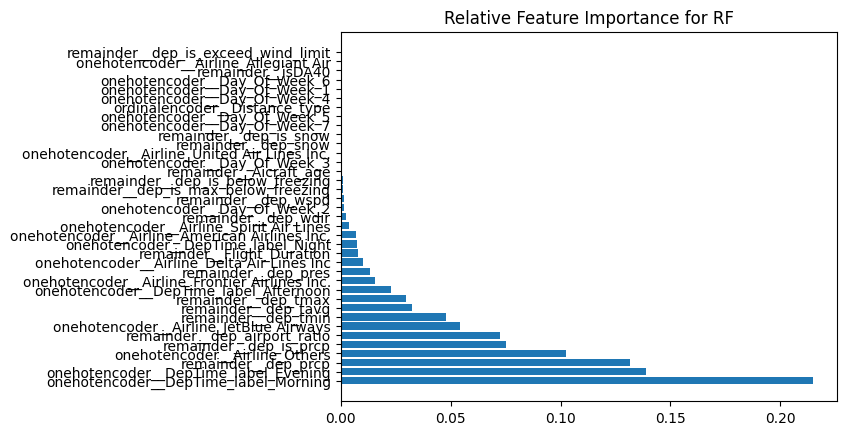

In [ ]:
# doing feature importance analysis using RF

# Access the random forest estimator
rf = pipeline_rf_severe.named_steps['random_forest']

# Get feature importances
rf_importances = rf.feature_importances_

# printing everything
order = np.flip(np.argsort(rf_importances))[:]
plt.barh(range(len(rf_importances)),
         rf_importances[order],
         tick_label=feature_names[order])
plt.title("Relative Feature Importance for RF")


Text(0.5, 1.0, 'Relative Feature Importance for RF')

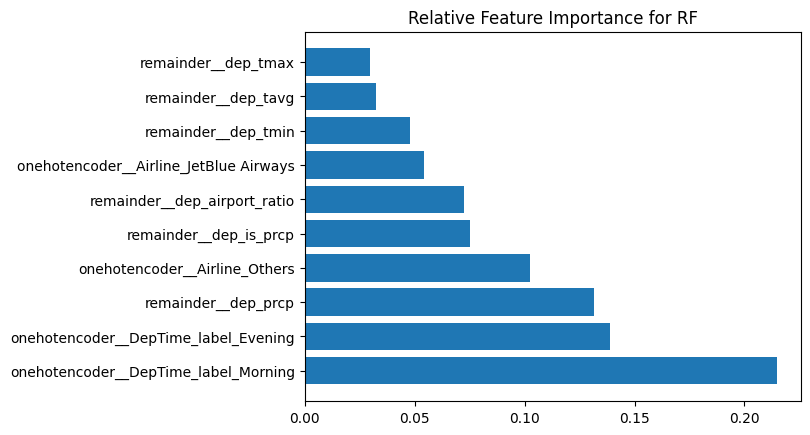

In [ ]:
# Specify the number of top features to print (K)
K = 10

order = np.flip(np.argsort(rf_importances))[:K]
plt.barh(range(K),
         rf_importances[order],
         tick_label=feature_names[order])
plt.title("Relative Feature Importance for RF")

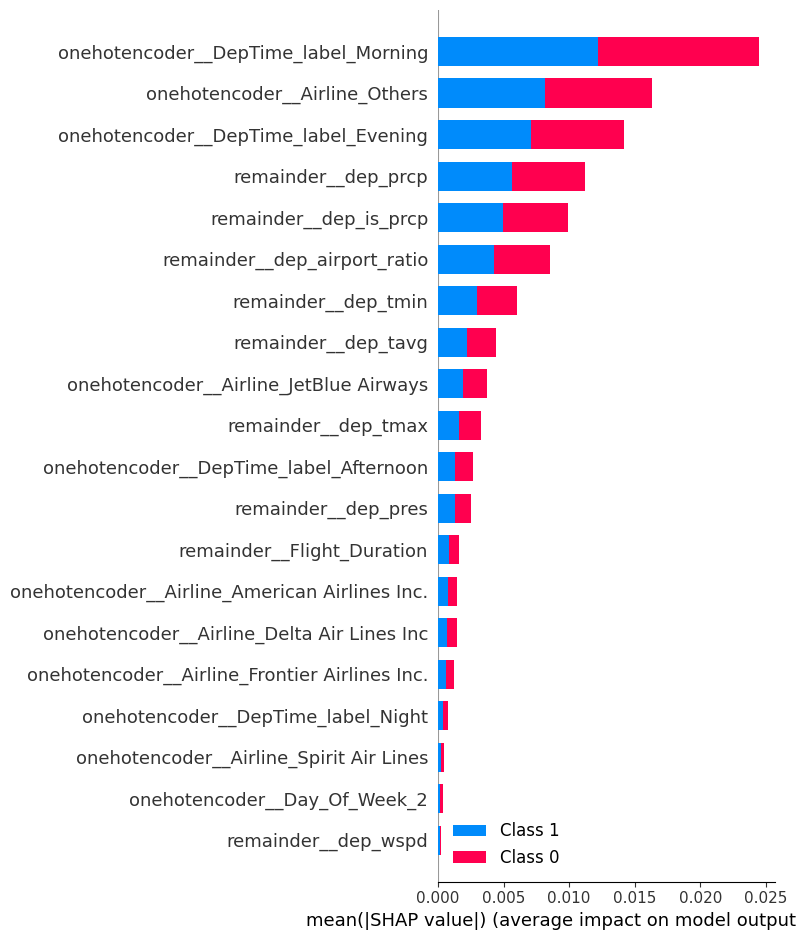

In [ ]:
# SHAP analysis for explainability

# subsampling 10K from original training dataset as proxy, since whole training dataset is very huge
chosen_instance = X_train.sample(10000, random_state=42)
explainer = shap.TreeExplainer(pipeline_rf_severe['random_forest'])

#apply the preprocessing to x_test
observations = pipeline_rf_severe['feature_transform'].transform(chosen_instance)
observations = pipeline_rf_severe['scaler'].transform(observations)

#get Shap values from preprocessed data
shap_values = explainer.shap_values(observations)

#plot the feature importance
shap.summary_plot(shap_values, features=observations, feature_names=feature_names)

In [ ]:
idx = 987
samp = chosen_instance.iloc[[idx]]
samp

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
4599519,4,American Airlines Inc.,Morning,158,Short Haul >1500Mi,14,0.080164,0,22.2,17.8,28.9,0.0,0.0,19.0,8.6,1017.5,0,0,0,0,0


In [ ]:
#apply the preprocessing to x_test
samp_obv = pipeline_rf_severe['feature_transform'].transform(samp)
samp_obv = pipeline_rf_severe['scaler'].transform(samp_obv)

#get Shap values from preprocessed data
shap.initjs()
shap_values = explainer.shap_values(samp_obv)
shap.force_plot(explainer.expected_value[1], shap_values[1], feature_names)

In [ ]:
idx = 798
samp = chosen_instance.iloc[[idx]]
samp

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
4465970,1,JetBlue Airways,Morning,267,Medium Haul <3000Mi,2,0.095964,0,5.1,-0.5,11.1,0.0,0.0,226.0,19.8,1019.0,0,0,0,0,0


In [ ]:
#apply the preprocessing to x_test
samp_obv = pipeline_rf_severe['feature_transform'].transform(samp)
samp_obv = pipeline_rf_severe['scaler'].transform(samp_obv)

#get Shap values from preprocessed data
shap.initjs()
shap_values = explainer.shap_values(samp_obv)
shap.force_plot(explainer.expected_value[1], shap_values[1], feature_names)

In [ ]:
idx = 847
samp = chosen_instance.iloc[[idx]]
samp

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
3629652,7,American Airlines Inc.,Afternoon,101,Short Haul >1500Mi,24,0.045561,0,25.5,17.8,34.4,0.0,0.0,189.0,9.1,1007.6,0,0,0,0,0


In [ ]:
#apply the preprocessing to x_test
samp_obv = pipeline_rf_severe['feature_transform'].transform(samp)
samp_obv = pipeline_rf_severe['scaler'].transform(samp_obv)

#get Shap values from preprocessed data
shap.initjs()
shap_values = explainer.shap_values(samp_obv)
shap.force_plot(explainer.expected_value[1], shap_values[1], feature_names)

In [ ]:
# LIME analysis for explainability

# subsampling 10K from original training dataset as proxy, since whole training dataset is very huge
chosen_instance = X_train.sample(10000, random_state=42)

#apply the preprocessing to x_test
observations = pipeline_rf_severe['feature_transform'].transform(chosen_instance)
observations = pipeline_rf_severe['scaler'].transform(observations)

explainer = LimeTabularExplainer(observations,
                                 feature_names=feature_names,
                                 class_names = ['normal', 'severe_delay'],
                                 mode='classification')

In [ ]:
j = 5
exp = explainer.explain_instance(observations[j], pipeline_rf_severe['random_forest'].predict_proba)
exp.show_in_notebook(show_table=True)

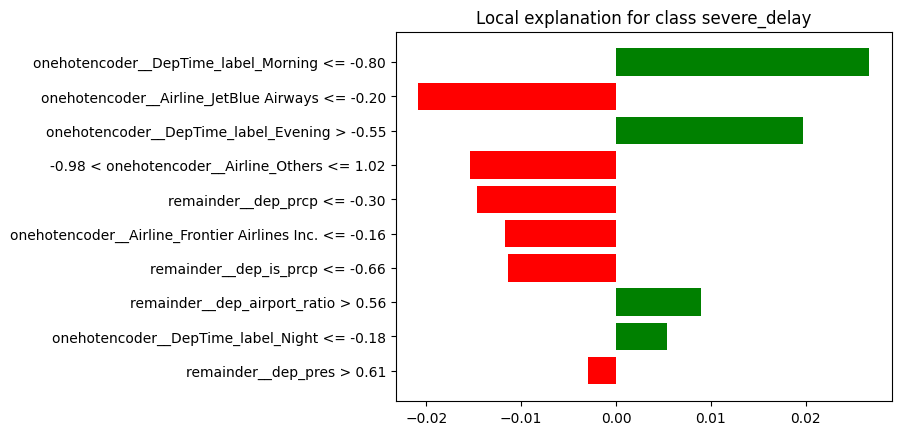

In [ ]:
exp.as_pyplot_figure();

In [ ]:
j = 47
exp = explainer.explain_instance(observations[j], pipeline_rf_severe['random_forest'].predict_proba)
exp.show_in_notebook(show_table=True)

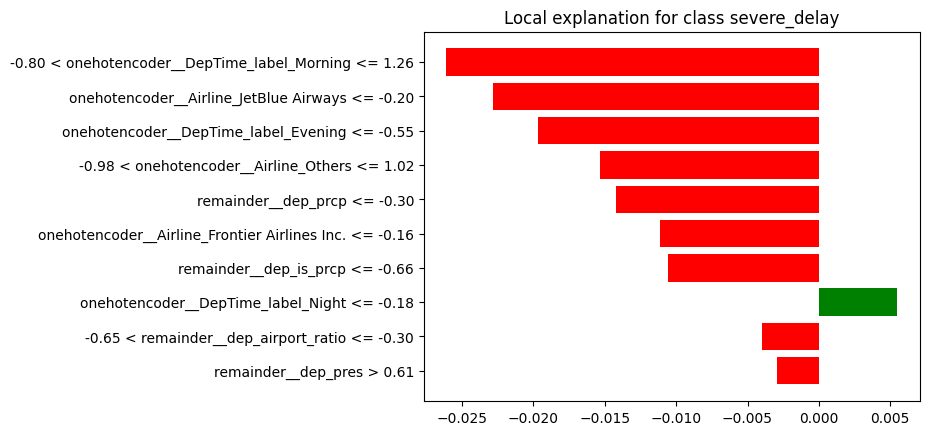

In [ ]:
exp.as_pyplot_figure();

In [ ]:
j = 869
exp = explainer.explain_instance(observations[j], pipeline_rf_severe['random_forest'].predict_proba)
exp.show_in_notebook(show_table=True)

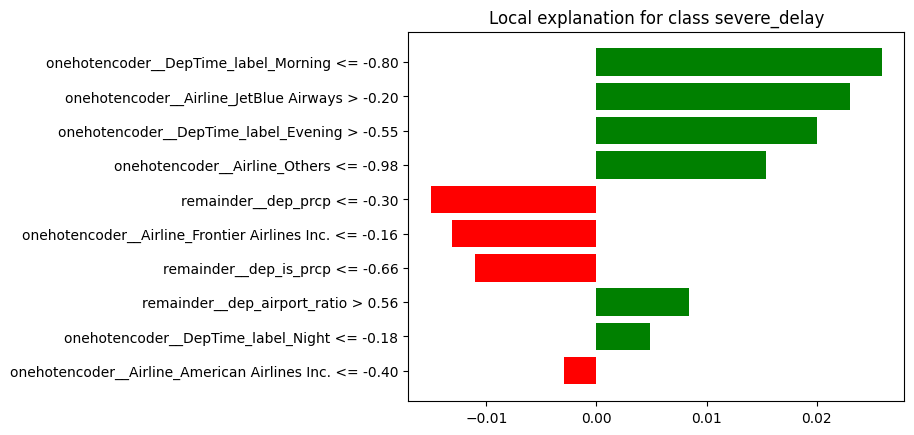

In [ ]:
exp.as_pyplot_figure();

In [ ]:
# GBC as model

In [ ]:
pipeline_gbc_severe = pipeline_gbc
pipeline_gbc_severe.fit(X_train, y_train)

Pipeline(steps=[('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['Day_Of_Week', 'Airline',
                                                   'DepTime_label']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Short '
                                                                              'Haul '
                                                                              '>1500Mi',
                                                                              'Medium '
                                                                              'Haul '
                                                                              '<3000Mi',
                                                                              'Long '
                                                                              'Haul '
                                                                              '<6000Mi']]),
                                                  ['Distance_type'])])),
                ('scaler', StandardScaler()),
                ('gradient_boosting', GradientBoostingClassifier(max_depth=5))])

In [ ]:
# Predict probabilities for AUC-ROC
y_probs = pipeline_gbc_severe.predict_proba(X_train)[:, 1]

# Calculate AUC-ROC
roc_auc = roc_auc_score(y_train, y_probs)
print("AUC-ROC Score:", roc_auc)

AUC-ROC Score: 0.7036243602784189


In [ ]:
# Get the feature names output by the ColumnTransformer
feature_names_gbc = pipeline_gbc_severe[:-1].get_feature_names_out()
feature_names_gbc

array(['onehotencoder__Day_Of_Week_1', 'onehotencoder__Day_Of_Week_2',
       'onehotencoder__Day_Of_Week_3', 'onehotencoder__Day_Of_Week_4',
       'onehotencoder__Day_Of_Week_5', 'onehotencoder__Day_Of_Week_6',
       'onehotencoder__Day_Of_Week_7',
       'onehotencoder__Airline_Allegiant Air',
       'onehotencoder__Airline_American Airlines Inc.',
       'onehotencoder__Airline_Delta Air Lines Inc',
       'onehotencoder__Airline_Frontier Airlines Inc.',
       'onehotencoder__Airline_JetBlue Airways',
       'onehotencoder__Airline_Others',
       'onehotencoder__Airline_Spirit Air Lines',
       'onehotencoder__Airline_United Air Lines Inc.',
       'onehotencoder__DepTime_label_Afternoon',
       'onehotencoder__DepTime_label_Evening',
       'onehotencoder__DepTime_label_Morning',
       'onehotencoder__DepTime_label_Night',
       'ordinalencoder__Distance_type', 'remainder__Flight_Duration',
       'remainder__Aicraft_age', 'remainder__dep_airport_ratio',
       'remainder__

Text(0.5, 1.0, 'Relative Feature Importance for GBC')

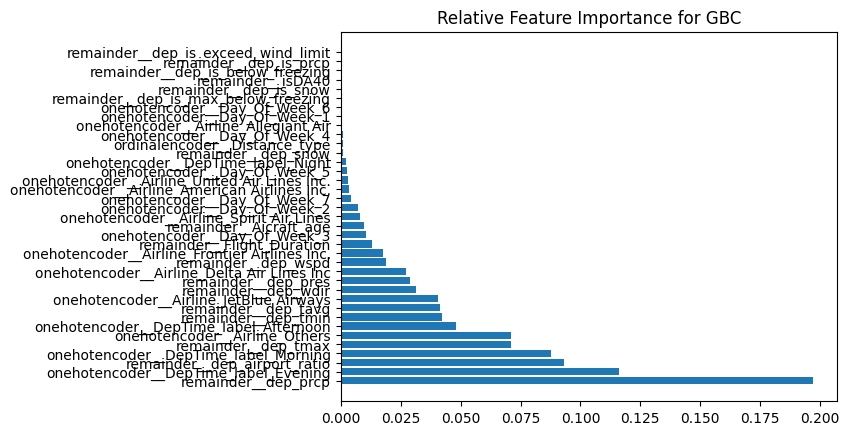

In [ ]:
# doing feature importance analysis using RF

# Access the random forest estimator
gradient_boosting = pipeline_gbc_severe.named_steps['gradient_boosting']

# Get feature importances
gbc_importances = gradient_boosting.feature_importances_

# printing everything
order = np.flip(np.argsort(gbc_importances))[:]
plt.barh(range(len(gbc_importances)),
         gbc_importances[order],
         tick_label=feature_names_gbc[order])
plt.title("Relative Feature Importance for GBC")


Text(0.5, 1.0, 'Relative Feature Importance for GBC')

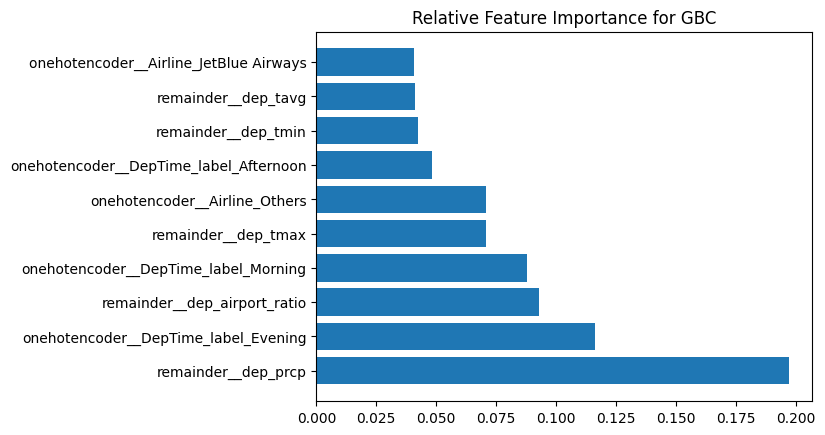

In [ ]:
# Specify the number of top features to print (K)
K = 10

order = np.flip(np.argsort(gbc_importances))[:K]
plt.barh(range(K),
         gbc_importances[order],
         tick_label=feature_names_gbc[order])
plt.title("Relative Feature Importance for GBC")

Observations (GBC compared against RF):
- New features: Flight duration, aircraft age
- Consistent in both models: Precipiation, departure time, temperature

In [ ]:
pipeline_xgb_severe = pipeline_xgb
pipeline_xgb_severe.fit(X_train, y_train)

Pipeline(steps=[('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['Day_Of_Week', 'Airline',
                                                   'DepTime_label']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Short '
                                                                              'Haul '
                                                                              '>1500Mi',
                                                                              'Medium '
                                                                              'Haul '
                                                                              '<3000Mi',
                                                                              'Long '
                                                                              'Haul '
                                                                              '<6000Mi']]),
                                                  ['Distance_type'])])),
                ('scaler', StandardScal...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

In [ ]:
# Predict probabilities for AUC-ROC
y_probs = pipeline_xgb_severe.predict_proba(X_train)[:, 1]

# Calculate AUC-ROC
roc_auc = roc_auc_score(y_train, y_probs)
print("AUC-ROC Score:", roc_auc)

AUC-ROC Score: 0.7183769859726995


In [ ]:
# Get the feature names output by the ColumnTransformer
feature_names_xgb = pipeline_xgb_severe[:-1].get_feature_names_out()
feature_names_xgb

array(['onehotencoder__Day_Of_Week_1', 'onehotencoder__Day_Of_Week_2',
       'onehotencoder__Day_Of_Week_3', 'onehotencoder__Day_Of_Week_4',
       'onehotencoder__Day_Of_Week_5', 'onehotencoder__Day_Of_Week_6',
       'onehotencoder__Day_Of_Week_7',
       'onehotencoder__Airline_Allegiant Air',
       'onehotencoder__Airline_American Airlines Inc.',
       'onehotencoder__Airline_Delta Air Lines Inc',
       'onehotencoder__Airline_Frontier Airlines Inc.',
       'onehotencoder__Airline_JetBlue Airways',
       'onehotencoder__Airline_Others',
       'onehotencoder__Airline_Spirit Air Lines',
       'onehotencoder__Airline_United Air Lines Inc.',
       'onehotencoder__DepTime_label_Afternoon',
       'onehotencoder__DepTime_label_Evening',
       'onehotencoder__DepTime_label_Morning',
       'onehotencoder__DepTime_label_Night',
       'ordinalencoder__Distance_type', 'remainder__Flight_Duration',
       'remainder__Aicraft_age', 'remainder__dep_airport_ratio',
       'remainder__

Text(0.5, 1.0, 'Relative Feature Importance for XGB')

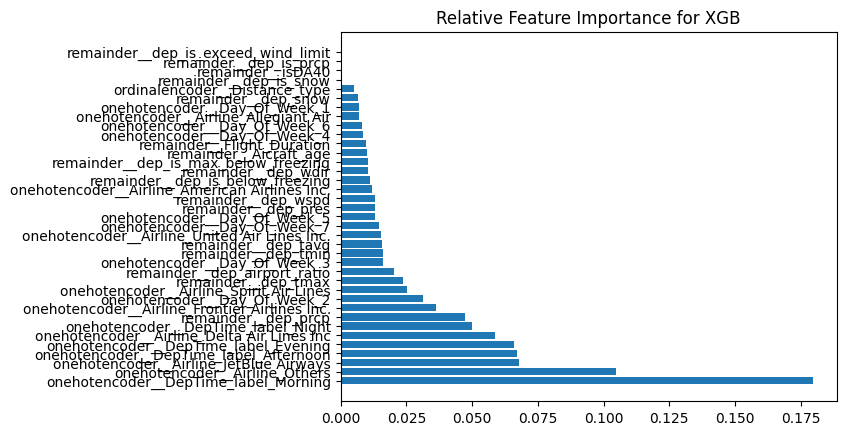

In [ ]:
# Access the random forest estimator
xgb_step = pipeline_xgb_severe.named_steps['xgboost']

# Get feature importances
xgb_importances = xgb_step.feature_importances_

# printing everything
order = np.flip(np.argsort(xgb_importances))[:]
plt.barh(range(len(xgb_importances)),
         xgb_importances[order],
         tick_label=feature_names_xgb[order])
plt.title("Relative Feature Importance for XGB")

Text(0.5, 1.0, 'Relative Feature Importance for XGB')

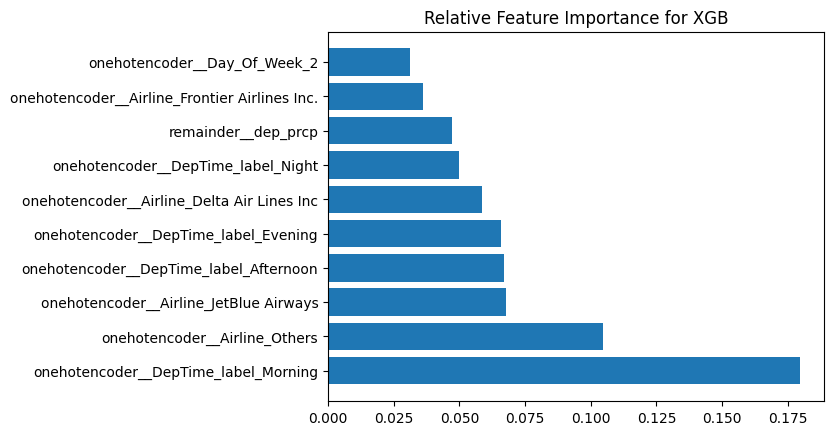

In [ ]:
# Specify the number of top features to print (K)
K = 10

order = np.flip(np.argsort(xgb_importances))[:K]
plt.barh(range(K),
         xgb_importances[order],
         tick_label=feature_names_xgb[order])
plt.title("Relative Feature Importance for XGB")

Observations across all 3 models:
- XGB new features (against GBC and RF): Airline type
- GBC New features (against RF): Flight duration, aircraft age
- Consistent in all models: Precipiation, departure time, temperature

Analysis:
- XGB can be argued to have bias since it is classifying based on airline models
- All 3 models using roughly same parameters (estimators of 100, max depth of 5) have roughly same accuracy of about 0.7
- AUC training: RF < GBC < XGB
- Speed: XGB < RF << GBC
- Since XGB is a good balance of speed and accuracy, we experiment with XGB with more parameters

### 5.1.2. Is Delay Analysis

In [ ]:
y_train = df['is_delay']

In [ ]:
pipeline_rf_any = pipeline_rf
pipeline_rf_any.fit(X_train, y_train)

Pipeline(steps=[('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['Day_Of_Week', 'Airline',
                                                   'DepTime_label']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Short '
                                                                              'Haul '
                                                                              '>1500Mi',
                                                                              'Medium '
                                                                              'Haul '
                                                                              '<3000Mi',
                                                                              'Long '
                                                                              'Haul '
                                                                              '<6000Mi']]),
                                                  ['Distance_type'])])),
                ('scaler', StandardScaler()),
                ('random_forest', RandomForestClassifier(max_depth=5))])

In [ ]:
# Predict probabilities for AUC-ROC
y_probs = pipeline_rf_any.predict_proba(X_train)[:, 1]

# Calculate AUC-ROC
roc_auc = roc_auc_score(y_train, y_probs)
print("AUC-ROC Score:", roc_auc)

AUC-ROC Score: 0.6453601613797987


In [ ]:
# Get the feature names output by the ColumnTransformer
feature_names = pipeline_rf_any[:-1].get_feature_names_out()
feature_names

array(['onehotencoder__Day_Of_Week_1', 'onehotencoder__Day_Of_Week_2',
       'onehotencoder__Day_Of_Week_3', 'onehotencoder__Day_Of_Week_4',
       'onehotencoder__Day_Of_Week_5', 'onehotencoder__Day_Of_Week_6',
       'onehotencoder__Day_Of_Week_7',
       'onehotencoder__Airline_Allegiant Air',
       'onehotencoder__Airline_American Airlines Inc.',
       'onehotencoder__Airline_Delta Air Lines Inc',
       'onehotencoder__Airline_Frontier Airlines Inc.',
       'onehotencoder__Airline_JetBlue Airways',
       'onehotencoder__Airline_Others',
       'onehotencoder__Airline_Spirit Air Lines',
       'onehotencoder__Airline_United Air Lines Inc.',
       'onehotencoder__DepTime_label_Afternoon',
       'onehotencoder__DepTime_label_Evening',
       'onehotencoder__DepTime_label_Morning',
       'onehotencoder__DepTime_label_Night',
       'ordinalencoder__Distance_type', 'remainder__Flight_Duration',
       'remainder__Aicraft_age', 'remainder__dep_airport_ratio',
       'remainder__

Text(0.5, 1.0, 'Relative Feature Importance for RF')

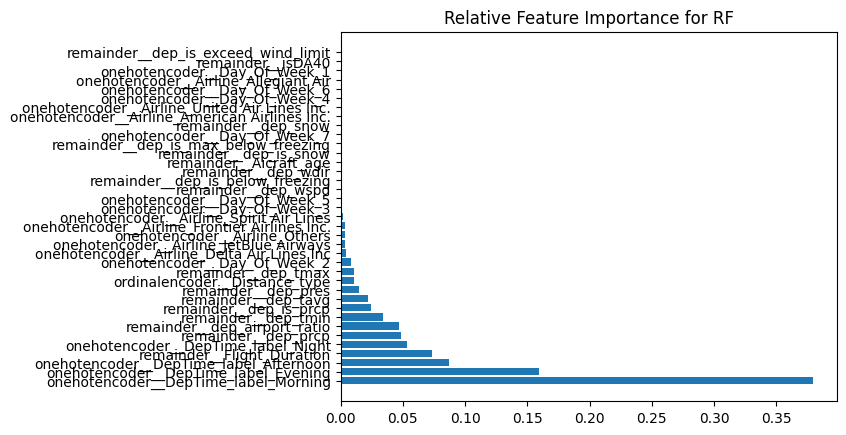

In [ ]:
# Access the random forest estimator
rf = pipeline_rf_any.named_steps['random_forest']

# Get feature importances
rf_importances = rf.feature_importances_

# printing everything
order = np.flip(np.argsort(rf_importances))[:]
plt.barh(range(len(rf_importances)),
         rf_importances[order],
         tick_label=feature_names[order])
plt.title("Relative Feature Importance for RF")


Text(0.5, 1.0, 'Relative Feature Importance for RF')

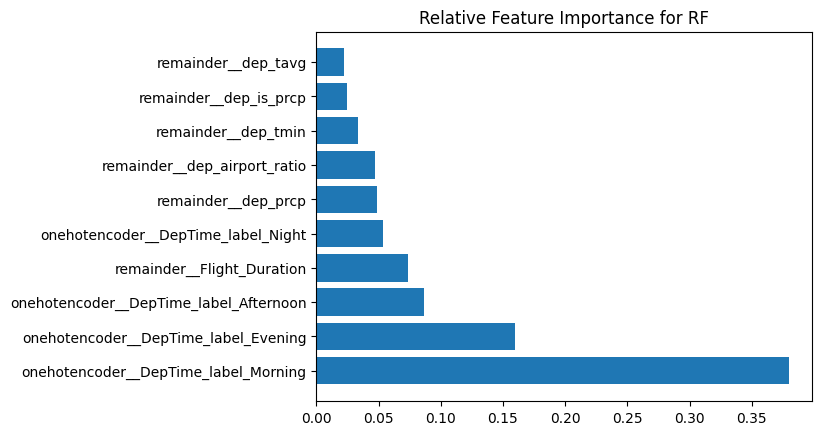

In [ ]:
# Specify the number of top features to print (K)
K = 10

order = np.flip(np.argsort(rf_importances))[:K]
plt.barh(range(K),
         rf_importances[order],
         tick_label=feature_names[order])
plt.title("Relative Feature Importance for RF")

Observations (Any Delays):
- Time of day identified as an important feature
- Followed by events relating to precipitation and temperature

Observations to Severe Delays follow similar patterns.

### 5.1.3. Correlation Analysis

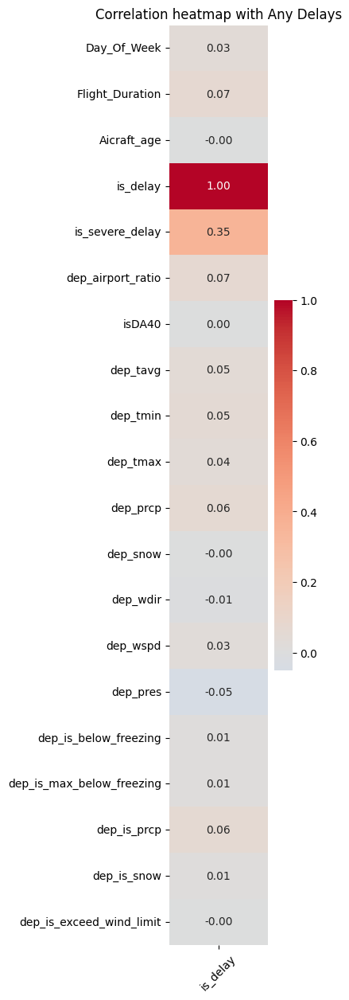

In [ ]:
# Calculate correlation matrix (considering numerical features)
corr_df = final_df.copy()

correlation_matrix = corr_df.select_dtypes('number').corr()
delay_corr = correlation_matrix['is_delay']

# Create heatmap
plt.figure(figsize=(2, 15))
heatmap = sns.heatmap(delay_corr.to_frame(), annot=True, cmap='coolwarm', center=0, fmt=".2f")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45)  # Rotate x-axis labels for better readability
plt.title('Correlation heatmap with Any Delays')
plt.show()

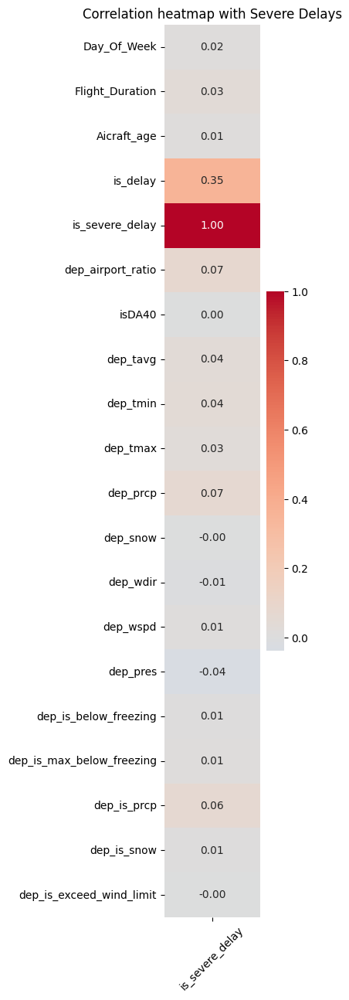

In [ ]:
delay_corr = correlation_matrix['is_severe_delay']

# Create heatmap
plt.figure(figsize=(2, 15))
heatmap = sns.heatmap(delay_corr.to_frame(), annot=True, cmap='coolwarm', center=0, fmt=".2f")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45)  # Rotate x-axis labels for better readability
plt.title('Correlation heatmap with Severe Delays')
plt.show()

Observations:
- Occurrence of delay is correlated with severe delays (trivial observation)
- Model being Is DA40 or not has no direct correlation

## 5.2 Evaluation

In [ ]:
df2 = test_df.copy()
df2['Airline'] = df2['Airline'].apply(lambda x: x if x in top_airlines else 'Others')
df2 = pd.merge(df2, dep_airports_sub, on='Dep_Airport', how='inner')
df2 = model_DA40(df2)
df2 = weather_features(df2)
df2 = drop_columns(df2)
df2

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,is_delay,is_severe_delay,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
0,3,Others,Afternoon,144,Short Haul >1500Mi,16,0,0,0.066878,0,-0.6,-6.6,9.4,0.0,0.0,202.0,15.5,1026.5,1,0,0,0,0
1,4,Others,Afternoon,155,Short Haul >1500Mi,16,1,0,0.066878,0,5.3,-1.0,15.6,0.0,0.0,182.0,10.1,1020.2,0,0,0,0,0
2,5,Others,Afternoon,146,Short Haul >1500Mi,16,0,0,0.066878,0,10.1,6.7,15.0,0.0,0.0,238.0,15.5,1015.3,0,0,0,0,0
3,7,Others,Morning,107,Short Haul >1500Mi,11,0,0,0.066878,0,9.8,2.8,18.9,0.0,0.0,171.0,17.6,1015.6,0,0,0,0,0
4,1,Others,Morning,96,Short Haul >1500Mi,16,0,0,0.066878,0,15.7,10.0,21.7,0.0,0.0,277.0,15.8,1008.7,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129347,6,Others,Afternoon,136,Short Haul >1500Mi,15,0,0,0.088785,0,6.3,-3.8,11.1,0.0,0.0,322.0,10.1,1015.3,0,0,0,0,0
1129348,3,Others,Afternoon,81,Short Haul >1500Mi,15,1,1,0.088785,0,5.0,-0.5,11.7,0.0,0.0,353.0,7.6,1021.8,0,0,0,0,0
1129349,6,Others,Afternoon,61,Short Haul >1500Mi,15,0,0,0.088785,0,6.3,-3.8,11.1,0.0,0.0,322.0,10.1,1015.3,0,0,0,0,0
1129350,5,Others,Afternoon,131,Short Haul >1500Mi,15,0,0,0.088785,0,3.9,-4.3,15.0,0.0,0.0,217.0,21.2,1019.3,0,0,0,0,0


In [ ]:
# Create X_train and y_train
X_test = df2.copy()
X_test.drop(columns='is_severe_delay', inplace=True)
y_test = df2['is_severe_delay']

In [ ]:
# Perform predictions on the test set using the fitted pipeline

# Predict probabilities for AUC-ROC
y_probs = pipeline_rf.predict_proba(X_test)[:, 1]

# Calculate AUC-ROC
roc_auc = roc_auc_score(y_test, y_probs)
print("AUC-ROC Score:", roc_auc)

AUC-ROC Score: 0.6135077013033471


In [ ]:
def train_and_predict(model_pipeline, X_train, y_train, X_test):
    model_pipeline.fit(X_train, y_train)
    pred_prob_train = model_pipeline.predict_proba(X_train)[:, 1]  # Probabilities for the positive class
    pred_prob_test = model_pipeline.predict_proba(X_test)[:, 1]
    pred_train = model_pipeline.predict(X_train)
    pred_test = model_pipeline.predict(X_test)
    return pred_prob_train, pred_prob_test, pred_train, pred_test

def calculate_metrics(y_train, pred_prob_train, pred_train, y_test, pred_prob_test, pred_test):
    metrics = {
        'Training AUC': roc_auc_score(y_train, pred_prob_train),
        'Testing AUC': roc_auc_score(y_test, pred_prob_test),
        'Training Precision': precision_score(y_train, pred_train),
        'Testing Precision': precision_score(y_test, pred_test),
        'Training Recall': recall_score(y_train, pred_train),
        'Testing Recall': recall_score(y_test, pred_test),
        'Training Accuracy': accuracy_score(y_train, pred_train),
        'Testing Accuracy': accuracy_score(y_test, pred_test)
    }
    return metrics

# List of models and their pipelines
models = [
    ('Logistic Regression', pipeline_log),
    ('Decision Tree', pipeline_dt),
    ('Random Forest', pipeline_rf),
    ('Gradient Boosting Classifier', pipeline_gbc),
    ('XGBoost Classifier', pipeline_xgb)
]

# Initialize an empty list to store results
results = []

# Loop through the models, train, predict, and calculate metrics
for name, model in models:
    pred_prob_train, pred_prob_test, pred_train, pred_test = train_and_predict(model, X_train, y_train, X_test)
    metrics = calculate_metrics(y_train, pred_prob_train, pred_train, y_test, pred_prob_test, pred_test)
    results.append({'Model': name, **metrics})

# Convert the results into a DataFrame
model_scores = pd.DataFrame(results)

# Display the models' scores
model_scores

,Model,Training AUC,Testing AUC,Training Precision,Testing Precision,Training Recall,Testing Recall,Training Accuracy,Testing Accuracy
0,Logistic Regression,0.680266,0.636771,0.121465,0.072625,0.626030,0.472848,0.637466,0.715470
1,Decision Tree,0.664730,0.623040,0.000000,0.000000,0.000000,0.000000,0.926042,0.956660
2,Random Forest,0.678440,0.627823,0.000000,0.000000,0.000000,0.000000,0.926042,0.956660
3,Gradient Boosting Classifier,0.703624,0.643534,0.673713,0.382353,0.007062,0.000266,0.926312,0.956653
4,XGBoost Classifier,0.719313,0.644603,0.640051,0.390411,0.014634,0.002329,0.926516,0.956603


In [ ]:
pipeline_xgb_grid

Pipeline(steps=[('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['Day_Of_Week', 'Airline',
                                                   'DepTime_label']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Short '
                                                                              'Haul '
                                                                              '>1500Mi',
                                                                              'Medium '
                                                                              'Haul '
                                                                              '<3000Mi',
                                                                              'Long '
                                                                              'Haul '
                                                                              '<6000Mi']]),
                                                  ['Distance_type'])])),
                ('scaler', StandardScal...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [ ]:
# Parameters to search over
param_grid = {
    'xgboost__n_estimators': [100,150,200],
    'xgboost__max_depth': [5,10,15]
}

### Validator ###
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 2024)

## GridSearch ###
grid = GridSearchCV(pipeline_xgb_grid,
                    param_grid,
                    scoring = ['precision', 'recall', 'f1', 'balanced_accuracy','roc_auc'],
                    refit = 'roc_auc',
                    cv = cv,
                   )


In [ ]:
grid.fit(X_train, y_train)

In [ ]:
best_score = grid.best_score_
print("Best score:", best_score)

Best score: 0.7410487037439062


In [ ]:
best_estimator = grid.best_estimator_
print("Best estimator:", best_estimator)

Best estimator: Pipeline(steps=[('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['Day_Of_Week', 'Airline',
                                                   'DepTime_label']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Short '
                                                                              'Haul '
                                                                              '>1500Mi',
                                                                              'Medium '
                                                                              'Haul '
                                                                              '<30

In [ ]:
# Get the best model
best_model = grid.best_estimator_

# Save the best model
dump(best_model, 'best_model.joblib')

['best_model.joblib']

In [ ]:
results = pd.DataFrame(grid.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_xgboost__max_depth,param_xgboost__n_estimators,params,split0_test_precision,split1_test_precision,split2_test_precision,split3_test_precision,split4_test_precision,mean_test_precision,std_test_precision,rank_test_precision,split0_test_recall,split1_test_recall,split2_test_recall,split3_test_recall,split4_test_recall,mean_test_recall,std_test_recall,rank_test_recall,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1,split0_test_balanced_accuracy,split1_test_balanced_accuracy,split2_test_balanced_accuracy,split3_test_balanced_accuracy,split4_test_balanced_accuracy,mean_test_balanced_accuracy,std_test_balanced_accuracy,rank_test_balanced_accuracy,split0_test_roc_auc,split1_test_roc_auc,split2_test_roc_auc,split3_test_roc_auc,split4_test_roc_auc,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc
0,30.676338,2.988692,5.924962,0.042846,5,100,"{'xgboost__max_depth': 5, 'xgboost__n_estimato...",0.644467,0.608947,0.624676,0.632931,0.615822,0.625368,0.012516,3,0.015499,0.015246,0.014511,0.015137,0.015655,0.015209,0.000394,9,0.030269,0.029747,0.028363,0.029567,0.030534,0.029696,0.000752,9,0.507408,0.507232,0.506907,0.507218,0.507437,0.507241,0.000189,9,0.714535,0.715521,0.715261,0.714389,0.715084,0.714958,0.000431,9
1,37.133815,4.568843,6.392870,0.106739,5,150,"{'xgboost__max_depth': 5, 'xgboost__n_estimato...",0.641867,0.618641,0.634677,0.634156,0.621694,0.630207,0.008692,2,0.021195,0.019184,0.018955,0.019809,0.019533,0.019735,0.000786,8,0.041034,0.037213,0.036810,0.038419,0.037875,0.038270,0.001488,8,0.510125,0.509120,0.509042,0.509448,0.509292,0.509405,0.000386,8,0.719780,0.720431,0.720018,0.718808,0.719530,0.719713,0.000541,7
2,41.930276,0.867943,6.877882,0.049447,5,200,"{'xgboost__max_depth': 5, 'xgboost__n_estimato...",0.638677,0.621533,0.631970,0.632680,0.629167,0.630805,0.005576,1,0.024181,0.022941,0.022519,0.023314,0.023639,0.023319,0.000571,7,0.046598,0.044248,0.043489,0.044970,0.045566,0.044974,0.001070,7,0.511544,0.510913,0.510736,0.511116,0.511263,0.511114,0.000280,7,0.723080,0.724006,0.723581,0.722348,0.722776,0.723158,0.000584,6
3,36.051020,1.149672,7.213356,0.152546,10,100,"{'xgboost__max_depth': 10, 'xgboost__n_estimat...",0.621329,0.630946,0.626280,0.621658,0.618433,0.623729,0.004397,4,0.058092,0.056226,0.058201,0.055166,0.056562,0.056849,0.001156,6,0.106251,0.103251,0.106504,0.101338,0.103645,0.104198,0.001945,6,0.527632,0.526800,0.527714,0.526242,0.526888,0.527055,0.000552,6,0.740073,0.740638,0.739408,0.739744,0.739367,0.739846,0.000471,3
4,47.176034,1.571863,8.323018,0.104951,10,150,"{'xgboost__max_depth': 10, 'xgboost__n_estimat...",0.608429,0.613445,0.611015,0.613430,0.610239,0.611312,0.001928,5,0.063283,0.062416,0.063596,0.061054,0.062295,0.062529,0.000889,5,0.114642,0.113303,0.115201,0.111055,0.113049,0.113450,0.001443,5,0.530015,0.529637,0.530181,0.528991,0.529558,0.529677,0.000414,5,0.741208,0.741896,0.741421,0.740472,0.740246,0.741049,0.000610,1
5,58.084583,0.883529,9.378556,0.087994,10,200,"{'xgboost__max_depth': 10, 'xgboost__n_estimat...",0.595279,0.606051,0.603002,0.601168,0.600700,0.601240,0.003524,6,0.066811,0.066582,0.067257,0.064438,0.066124,0.066242,0.000973,4,0.120139,0.119983,0.121016,0.116399,0.119134,0.119334,0.001584,4,0.531592,0.531563,0.531860,0.530512,0.531307,0.531367,0.000462,4,0.740766,0.741598,0.741379,0.740144,0.740336,0.740845,0.000567,2
6,49.933093,1.389588,9.409228,0.109456,15,100,"{'xgboost__max_depth': 15, 'xgboost__n_estimat...",0.519120,0.523666,0.522252,0.524188,0.524964,0.522838,0.002059,7,0.085826,0.085802,0.085922,0.084296,0.086608,0.085691,0.000758,3,0.147299,0.147445,0.147567,0.145236,0.148686,0.147247,0.001119,3,0.539738,0.539784,0.539823,0.539092,0.540174,0.539722,0.000351,3,0.728687,0.729573,0.730630,0.728963,0.729299,0.729430,0.000670,4
7,68.793505,1.936767,11.899007,0.112170,15,150,"{'xgboost__max_depth': 15, 'xgboost__n_estimat...",0.485627,0.

## 5.3 Best Model Explanability

In [ ]:
from joblib import load

# Load the model from the file
pipeline_xgb_best = load('best_model.joblib')


In [ ]:
pipeline_xgb_best

Pipeline(steps=[('feature_transform',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['Day_Of_Week', 'Airline',
                                                   'DepTime_label']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Short '
                                                                              'Haul '
                                                                              '>1500Mi',
                                                                              'Medium '
                                                                              'Haul '
                                                                              '<3000Mi',
                                                                              'Long '
                                                                              'Haul '
                                                                              '<6000Mi']]),
                                                  ['Distance_type'])])),
                ('scaler', StandardScal...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=10, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=150, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [ ]:
# Get the feature names output by the ColumnTransformer
feature_names = pipeline_xgb_best[:-1].get_feature_names_out()
feature_names

array(['onehotencoder__Day_Of_Week_1', 'onehotencoder__Day_Of_Week_2',
       'onehotencoder__Day_Of_Week_3', 'onehotencoder__Day_Of_Week_4',
       'onehotencoder__Day_Of_Week_5', 'onehotencoder__Day_Of_Week_6',
       'onehotencoder__Day_Of_Week_7',
       'onehotencoder__Airline_Allegiant Air',
       'onehotencoder__Airline_American Airlines Inc.',
       'onehotencoder__Airline_Delta Air Lines Inc',
       'onehotencoder__Airline_Frontier Airlines Inc.',
       'onehotencoder__Airline_JetBlue Airways',
       'onehotencoder__Airline_Others',
       'onehotencoder__Airline_Spirit Air Lines',
       'onehotencoder__Airline_United Air Lines Inc.',
       'onehotencoder__DepTime_label_Afternoon',
       'onehotencoder__DepTime_label_Evening',
       'onehotencoder__DepTime_label_Morning',
       'onehotencoder__DepTime_label_Night',
       'ordinalencoder__Distance_type', 'remainder__Flight_Duration',
       'remainder__Aicraft_age', 'remainder__dep_airport_ratio',
       'remainder__

Text(0.5, 1.0, 'Relative Feature Importance for XGB')

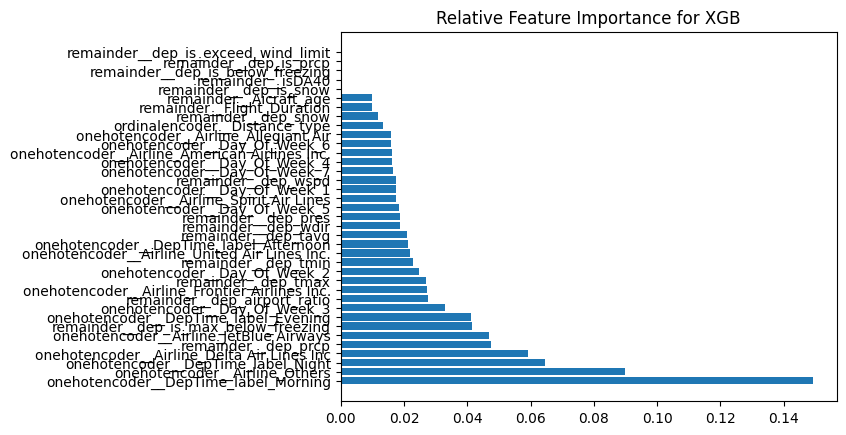

In [ ]:
# doing feature importance analysis using xgb

# Access the xgboost estimator
xgb = pipeline_xgb_best.named_steps['xgboost']

# Get feature importances
xgb_importances = xgb.feature_importances_

# printing everything
order = np.flip(np.argsort(xgb_importances))[:]
plt.barh(range(len(xgb_importances)),
         xgb_importances[order],
         tick_label=feature_names[order])
plt.title("Relative Feature Importance for XGB")


Text(0.5, 1.0, 'Relative Feature Importance for XGB')

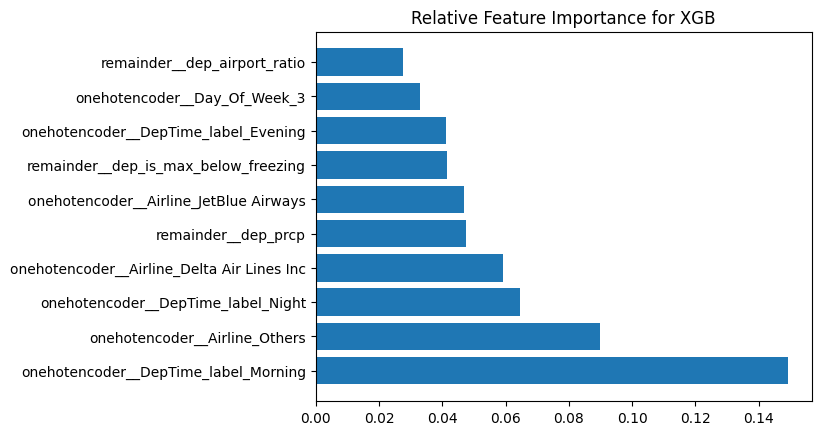

In [ ]:
# Specify the number of top features to print (K)
K = 10

order = np.flip(np.argsort(xgb_importances))[:K]
plt.barh(range(K),
         xgb_importances[order],
         tick_label=feature_names[order])
plt.title("Relative Feature Importance for XGB")

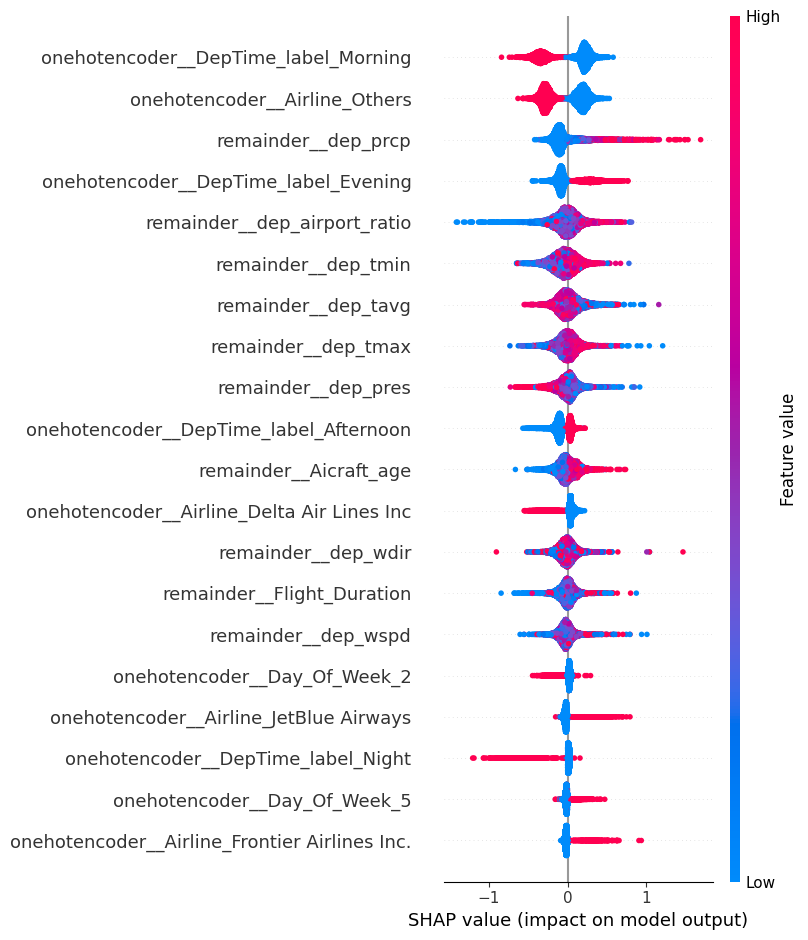

In [ ]:
# SHAP analysis for explainability

# subsampling 10K from original training dataset as proxy, since whole training dataset is very huge
chosen_instance = X_train.sample(10000, random_state=42)
explainer = shap.TreeExplainer(pipeline_xgb_best.named_steps['xgboost'])

#apply the preprocessing to x_test
observations = pipeline_xgb_best['feature_transform'].transform(chosen_instance)
observations = pipeline_xgb_best['scaler'].transform(observations)

#get Shap values from preprocessed data
shap_values = explainer.shap_values(observations)

#plot the feature importance
shap.summary_plot(shap_values, features=observations, feature_names=feature_names)

In [ ]:
idx = 987
samp = chosen_instance.iloc[[idx]]
samp

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
4599519,4,American Airlines Inc.,Morning,158,Short Haul >1500Mi,14,0.080164,0,22.2,17.8,28.9,0.0,0.0,19.0,8.6,1017.5,0,0,0,0,0


In [ ]:
#apply the preprocessing to x_test
samp_obv = pipeline_xgb_best['feature_transform'].transform(samp)
samp_obv = pipeline_xgb_best['scaler'].transform(samp_obv)

#get Shap values from preprocessed data
shap.initjs()
shap_values = explainer.shap_values(samp_obv)
shap.force_plot(explainer.expected_value, shap_values, feature_names)


In [ ]:
idx = 798
samp = chosen_instance.iloc[[idx]]
samp

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
4465970,1,JetBlue Airways,Morning,267,Medium Haul <3000Mi,2,0.095964,0,5.1,-0.5,11.1,0.0,0.0,226.0,19.8,1019.0,0,0,0,0,0


In [ ]:
#apply the preprocessing to x_test
samp_obv = pipeline_xgb_best['feature_transform'].transform(samp)
samp_obv = pipeline_xgb_best['scaler'].transform(samp_obv)

#get Shap values from preprocessed data
shap.initjs()
shap_values = explainer.shap_values(samp_obv)
shap.force_plot(explainer.expected_value, shap_values, feature_names)

In [ ]:
idx = 847
samp = chosen_instance.iloc[[idx]]
samp

,Day_Of_Week,Airline,DepTime_label,Flight_Duration,Distance_type,Aicraft_age,dep_airport_ratio,isDA40,dep_tavg,dep_tmin,dep_tmax,dep_prcp,dep_snow,dep_wdir,dep_wspd,dep_pres,dep_is_below_freezing,dep_is_max_below_freezing,dep_is_prcp,dep_is_snow,dep_is_exceed_wind_limit
3629652,7,American Airlines Inc.,Afternoon,101,Short Haul >1500Mi,24,0.045561,0,25.5,17.8,34.4,0.0,0.0,189.0,9.1,1007.6,0,0,0,0,0


In [ ]:
#apply the preprocessing to x_test
samp_obv = pipeline_xgb_best['feature_transform'].transform(samp)
samp_obv = pipeline_xgb_best['scaler'].transform(samp_obv)

#get Shap values from preprocessed data
shap.initjs()
shap_values = explainer.shap_values(samp_obv)
shap.force_plot(explainer.expected_value, shap_values, feature_names)

In [ ]:
# LIME analysis for explainability

# subsampling 10K from original training dataset as proxy, since whole training dataset is very huge
chosen_instance = X_train.sample(10000, random_state=42)

#apply the preprocessing to x_test
observations = pipeline_xgb_best['feature_transform'].transform(chosen_instance)
observations = pipeline_xgb_best['scaler'].transform(observations)

explainer = LimeTabularExplainer(observations,
                                 feature_names=feature_names,
                                 class_names = ['normal', 'severe_delay'],
                                 mode='classification')

In [ ]:
# LIME analysis for explainability

# subsampling 10K from original training dataset as proxy, since whole training dataset is very huge
chosen_instance = X_train.sample(10000, random_state=42)

#apply the preprocessing to x_test
observations = pipeline_xgb_best['feature_transform'].transform(chosen_instance)
observations = pipeline_xgb_best['scaler'].transform(observations)

explainer = LimeTabularExplainer(observations,
                                 feature_names=feature_names,
                                 class_names = ['normal', 'severe_delay'],
                                 mode='classification')

In [ ]:
j = 5
exp = explainer.explain_instance(observations[j], pipeline_xgb_best['xgboost'].predict_proba)
exp.show_in_notebook(show_table=True)

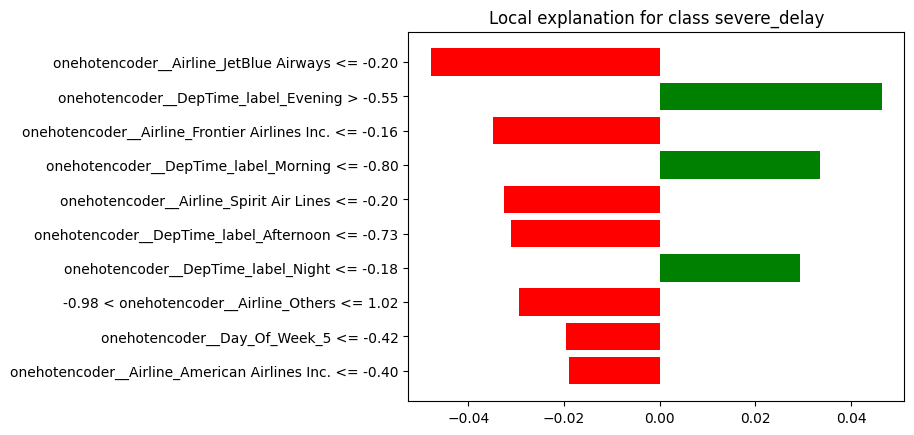

In [ ]:
exp.as_pyplot_figure();

In [ ]:
j = 47
exp = explainer.explain_instance(observations[j], pipeline_xgb_best['xgboost'].predict_proba)
exp.show_in_notebook(show_table=True)

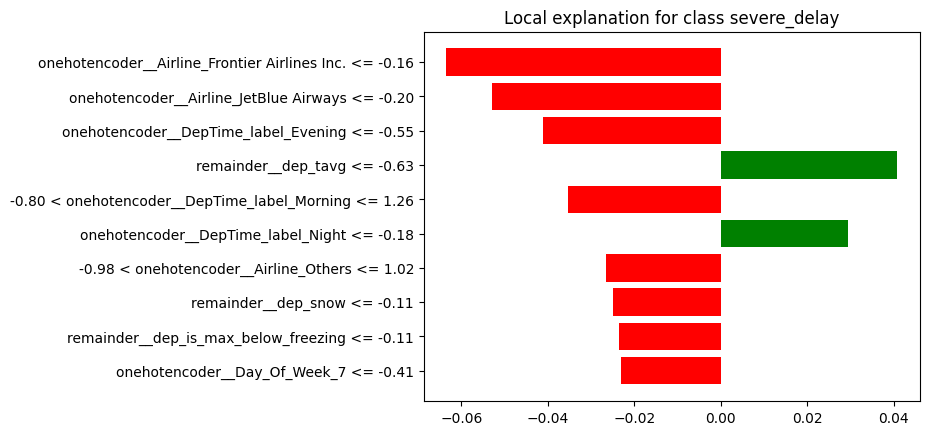

In [ ]:
exp.as_pyplot_figure();

In [ ]:
j = 869
exp = explainer.explain_instance(observations[j], pipeline_xgb_best['xgboost'].predict_proba)
exp.show_in_notebook(show_table=True)

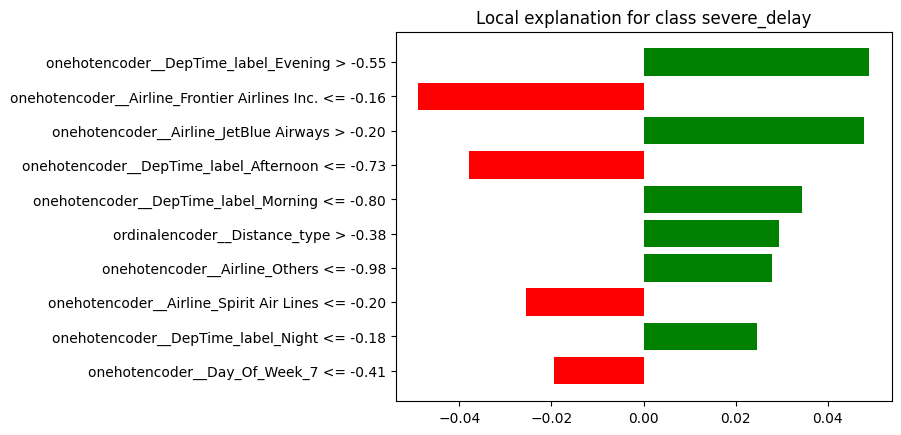

In [ ]:
exp.as_pyplot_figure();